### Packages

In [1]:
# cd /project/3022057.01/IFA
# module load anaconda3
# source activate IFAenv
# jupyter notebook --no-browser --ip=* --port=8888 --NotebookApp.token=''

import os
import random
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.linalg import eigh
from sklearn.decomposition import FastICA, PCA
from sklearn.manifold import MDS
from nilearn import plotting as nplot
from nilearn import image as nimg
from nilearn import datasets, plotting
from nilearn.regions import connected_label_regions
from nilearn import input_data
from nilearn import image as nimg
from nilearn.connectome import ConnectivityMeasure

/home/mrstats/zaisou/.local/lib/python3.10/site-packages/nilearn/input_data/__init__.py:23: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


### Helper Functions

In [2]:
# https://dartbrains.org/content/Parcellations.html#summary-of-differences-between-parcellations
# https://nipy.org/nibabel/nibabel_images.html
# https://nilearn.github.io/dev/auto_examples/03_connectivity/plot_signal_extraction.html
# https://nilearn.github.io/dev/modules/generated/nilearn.regions.Parcellations.html
# https://dartbrains.org/content/Parcellations.html#nilearn
# https://carpentries-incubator.github.io/SDC-BIDS-fMRI/aio/index.html
def create_mask(dir='../resources/rois/',n_rois=200, yeo_networks=17, resolution_mm=1):
    if dir == '../resources/rois/':
        parcel_dir = dir
        schaefer = datasets.fetch_atlas_schaefer_2018(n_rois,yeo_networks,resolution_mm,data_dir=parcel_dir)
        atlas_schaefer = schaefer['maps']
        atlas = connected_label_regions(atlas_schaefer)
    else:
        atlas = dir
    masker = input_data.NiftiLabelsMasker(labels_img=atlas,
                                        standardize=True)
    atlas_img = nimg.load_img(atlas)
    region_labels = np.unique(atlas_img.get_fdata())
    region_labels = np.setdiff1d(region_labels, [0])

    return masker, atlas, region_labels

In [3]:
def view_labels(atlas,roi = 'a == 1'):
    # View rois
    nplot.plot_roi(atlas,
                cut_coords=(-20,-10,0,10,20,30,40,50,60,70),
                display_mode='z',
                colorbar=True,
                cmap='Paired')
    
    # Make a mask for ROI 44
    roi_mask = nimg.math_img(roi, a=atlas)  
    # Visualize ROI
    nplot.plot_roi(roi_mask)
    

In [4]:
def view_data_labels(sub_data,region_labels):
    # View sub data at 4th sample
    nplot.view_img(sub_data.slicer[:,:,:,4])
        
    # Resample rois to match sub_data
    print("Size of functional image:", sub_data.shape)
    print("Size of atlas image:", region_labels.shape)
    resampled_schaefer = nimg.resample_to_img(region_labels, sub_data)
    print("Size of resampled atlas image:", resampled_schaefer.shape)

    # View different overlays of roi and subdata at 1000th sample
    nplot.plot_roi(resampled_schaefer, sub_data.slicer[:, :, :, 1000])
    nplot.view_img(resampled_schaefer,sub_data.slicer[:, :, :, 1000])

In [5]:
def parcellate(sub_data, masker, region_labels, verbose=False):
    # Create parcellated data
    parcellated = masker.fit_transform(sub_data)
    num_labels = len(region_labels)
    
    # where t is the number of timepoints
    num_timepoints = sub_data.shape[3]
    # Create an array of zeros that has the correct size
    final_signal = np.zeros((num_timepoints, num_labels))

    # Get regions that are kept
    regions_kept = np.array(masker.labels_,dtype='int')

    # Fill columns matching labels with signal values
    final_signal[:, regions_kept-1] = parcellated
    if verbose:
        print("Number of atlas labels: ", num_labels)
        print("Number of parcellated labels: ", len(masker.labels_))
        print("Missing labels: ", set(region_labels) - set(np.unique(masker.labels_)))
    return final_signal

In [6]:
def parcellate_all(allsubs, mask, region_labels, save=False,verbose=False,location=''):
    main_output_directory = os.path.normpath(r"/project/3022057.01/")

    alldata = []
    for sub in allsubs:
        for task in sub:
            if verbose:
                print(task)
            sub_data = nimg.load_img(task)
            parcellated = parcellate(sub_data, mask, region_labels, verbose=verbose)
            alldata.append(parcellated)
            if save:
                subdir = task[task.find("S1200") + len("S1200"):].split("/")[1]
                taskdir = task[task.find("Results") + len("Results"):].split("/")[1]
                sub_output_directory = os.path.join(main_output_directory, location,subdir)
                os.makedirs(sub_output_directory, exist_ok=True)
                output_filename = os.path.join(sub_output_directory, f"{taskdir}_parcellated.npy")
                print(output_filename)
                np.save(output_filename, parcellated)
    return alldata 

In [87]:
import warnings
def standardize_demean(group):
    if np.isnan(group).any():
        # If NaNs are present, replace them with zeros
        group = np.nan_to_num(group)
        print("Warning: NaNs found in the data. Replacing with zeros.")
        
    preprocessed_group = np.zeros_like(group)

    for i, subject in enumerate(group):
        # parcels_means = np.mean(subject,axis=1,keepdims=True)
        # standardized_subject = subject - parcels_means

        # time_series_means = np.mean(standardized_subject,axis=0,keepdims=True)
        # time_series_std = np.std(standardized_subject,axis=0,ddof=1)
        # standardized_subject = (standardized_subject-time_series_means)/ time_series_std
        
        time_series_means = np.mean(subject,axis=0,keepdims=True)
        time_series_std = np.std(subject,axis=0,ddof=1)
        epsilon = 1e-11
        time_series_std = np.where(time_series_std < epsilon, epsilon, time_series_std)
        with warnings.catch_warnings():
            warnings.filterwarnings('error', category=RuntimeWarning)
            try:
                standardized_subject = (subject - time_series_means) / time_series_std
            except RuntimeWarning as warning:
                print("Warning encountered at subject", i)
                print("RuntimeWarning:", warning)
                print("Values causing the warning:")
                print("time_series_std:", time_series_std)
            
        preprocessed_group[i,:,:] = standardized_subject

    return preprocessed_group


In [8]:
from scipy.signal import sawtooth

def create_signal(samples, parcels, sig_freqA=.03,sig_freqB=.05, spatial_ratio=.1, temporal_ratio=.1, amp=1, type="saw", visualize=False):

    # Create a random subset of parcels to add the signal
    num_parcels_with_signal = int(spatial_ratio * parcels)
    groupA_parcels = np.random.choice(parcels, size=num_parcels_with_signal, replace=False)
    groupB_parcels = np.random.choice(np.setdiff1d(np.arange(parcels), groupA_parcels), size=num_parcels_with_signal, replace=False)

    x = np.linspace(0, samples, num=samples)
    if type == "sin":
        groupA_signal = temporal_ratio * amp * np.sin(sig_freqA * x)
        groupB_signal = temporal_ratio * amp * sawtooth(sig_freqB * x)
    else:
        groupA_signal = temporal_ratio * amp * sawtooth(sig_freqA * x)
        groupB_signal = temporal_ratio * amp * np.sin(sig_freqB * x)
    
    parcelsA = np.zeros((samples, parcels))
    parcelsB = np.zeros((samples, parcels))
    # Add the signal to the selected parcels
    parcelsA[:, groupA_parcels] += np.reshape(groupA_signal, (-1, 1))
    parcelsB[:, groupB_parcels] += np.reshape(groupB_signal, (-1, 1))

    if visualize:
        # Plot heatmap
        plt.figure(figsize=(12, 12))
        plt.subplot(3,1,1)
        plt.imshow(parcelsA.T, aspect='auto', cmap='viridis', origin='lower')
        plt.colorbar(label='Amplitude')
        plt.title('Heatmap of Genarated Group A fMRI Matrix')
        plt.xlabel('Samples')
        plt.ylabel('Parcels')
        
        plt.subplot(3,1,2)
        plt.imshow(parcelsB.T, aspect='auto', cmap='viridis', origin='lower')
        plt.colorbar(label='Amplitude')
        plt.title('Heatmap of Genarated Group B fMRI Matrix')
        plt.xlabel('Samples')
        plt.ylabel('Parcels')

        # Plot each parcel as a line plot
        plt.subplot(3,1,3)
        plt.plot(groupA_signal,label="Group A Signal")
        plt.plot(groupB_signal,label="Group B Signal")
        plt.title('Signal in Selected Parcels')
        plt.legend()
        plt.xlabel('Samples')
        plt.ylabel('Amplitude')
        plt.tight_layout()
        plt.show()

    return groupA_signal, groupB_signal, groupA_parcels, groupB_parcels

In [51]:
def simulate_data(allsubs_data, sig_freqA=.03,sig_freqB=.5,spatial_ratio=.01, temporal_ratio=.8, sub_ratio=.5, noise_level=0.01, shared_level=0.0, simulateA=True, simulateB=True):
    samples = allsubs_data[0].shape[0]
    parcels = allsubs_data[0].shape[1]
    amp = np.max(allsubs_data[0])
    groupA_simulated_signal, groupB_simulated_signal, groupA_parcels, groupB_parcels = create_signal(samples,parcels, sig_freqA=sig_freqA, sig_freqB=sig_freqB ,spatial_ratio=spatial_ratio,temporal_ratio=temporal_ratio,amp=amp,type="saw", visualize=True)
    
    nsubjects = len(allsubs_data)
    nsubjects_semi_simulated = int(nsubjects*sub_ratio)

    selected_subjects = np.random.choice(nsubjects, size=nsubjects_semi_simulated, replace=False)
    unselected_subjects = np.array(np.setdiff1d(np.arange(nsubjects),selected_subjects))

    groupA_data = allsubs_data[selected_subjects,:,:].copy()
    groupB_data = allsubs_data[unselected_subjects,:,:].copy()
    
    if simulateA:
        for i, subject in enumerate(groupA_data):
            for parcel in groupA_parcels:
                groupA_data[i,:,parcel] = shared_level*subject[:,parcel] + groupA_simulated_signal + noise_level * np.random.rand(samples)
    
        # groupB_data[:,:,groupA_parcels] = shared_level*groupB_data[:,:,groupA_parcels] + noise_level *np.random.rand(groupB_data[:,:,groupA_parcels].shape[0],samples,groupB_data[:,:,groupA_parcels].shape[2])

    if simulateB:
        for i, subject in enumerate(groupB_data):
            for parcel in groupB_parcels:
                groupB_data[i,:,parcel] = shared_level*subject[:,parcel] + groupB_simulated_signal + noise_level * np.random.rand(samples)
        
        # groupA_data[:,:,groupB_parcels] = shared_level*groupA_data[:,:,groupB_parcels] + noise_level *np.random.rand(groupA_data[:,:,groupA_parcels].shape[0],samples,groupA_data[:,:,groupA_parcels].shape[2])
        
    return groupA_data, groupB_data, groupA_parcels, groupB_parcels

In [10]:
def load(n=0,folder1=0,folder2=-1):
    # Min and max number of subjects
    if n < 0:
        n = 0
    elif n > 1113:
        n = 1113

    # Define the directory where the data is stored
    base_directory = "/project_cephfs/3022017.01/S1200"
    subdirectory = "MNINonLinear/Results"
    
    # Define the list of folders for rfMRI and tfMRI
    folders = ["rfMRI_REST1_LR","rfMRI_REST1_RL","rfMRI_REST2_LR","rfMRI_REST2_RL","tfMRI_EMOTION_LR",
                    "tfMRI_EMOTION_RL","tfMRI_GAMBLING_LR","tfMRI_GAMBLING_RL","tfMRI_LANGUAGE_LR","tfMRI_LANGUAGE_RL",
                        "tfMRI_MOTOR_LR", "tfMRI_MOTOR_RL", "tfMRI_RELATIONAL_LR", "tfMRI_RELATIONAL_RL", "tfMRI_SOCIAL_LR",
                            "tfMRI_SOCIAL_RL", "tfMRI_WM_LR", "tfMRI_WM_RL"]
    
    # Randomly select n subjects without repetition
    selected_subjects = set()
    while len(selected_subjects) < n:
        subject = random.choice(os.listdir(base_directory))
        subject_data1 = os.path.join(base_directory, subject, subdirectory, folders[folder1], folders[folder1] + ".nii.gz")

        # Check if the file exists before adding the subject
        if os.path.exists(subject_data1):
            if folder2 > 0:
                subject_data2 = os.path.join(base_directory, subject, subdirectory, folders[folder2],folders[folder2] + ".nii.gz")
                # Check if the second file exists before adding it
                if os.path.exists(subject_data2):
                    selected_subjects.add((subject_data1, subject_data2))
            else:
                selected_subjects.add((subject_data1,))

    return [list(sub) for sub in selected_subjects]

In [11]:
from sklearn.covariance import LedoitWolf

def regcov(data, gamma=0.0001, sc=1.0, beta=0.0, ddof=1.0, groundtruth=None):
    # # TODO parallelize and remove for loops or use Leidot wolf
    #     Lcov = LedoitWolf().fit(np.squeeze(data[sub,:,:]).T)
    #     covs[sub,:,:]=Lcov.covariance_
    # Initialize arrays to store the regularized covariance matrices for each subject
    # Compute the ground truth covariance matrices for each group (before adding noise)
    samples = data.shape[0]
    parcels =  data.shape[1]

    if groundtruth is None:
        groundtruthC = np.zeros((parcels, parcels))
    else:
        groundtruthC = groundtruth
        
    subdata_demean = data - np.mean(data,axis=1,keepdims=True)

    subC = subdata_demean.T@subdata_demean
    subC = data.T@data
    I = np.identity(parcels)  # Identity matrix of the same size as subC
    # Apply the second regularization term using the ground truth covariance matrices
    Chat = (1.0 - beta) * sc * subC + beta * groundtruthC
    # Apply regularization to the initial covariance matrices
    Creg = (1.0 - gamma) * Chat + gamma * I
    Creg = Creg/(samples-ddof)
    # Creg = LedoitWolf().fit(subdata_demean)
    # return Creg.covariance_
    return Creg

In [12]:
def numerical_stability(groupA_cov, groupB_cov):
    
    # Method 1
    C = groupA_cov+groupB_cov
    eigs, vecs = eigh(C)
    P = np.diag(np.power(eigs,-.5))@vecs.T
    S1 = P@groupA_cov@P.T
    S2 = P@groupB_cov@P.T

    groupA_eigs1, groupA_filters1 = eigh(S1,eigvals_only=False)
    groupB_eigs1, groupB_filters1 = eigh(S2,eigvals_only=False)

    # Method 2
    groupA_eigs2, groupA_filters2 = eigh(np.linalg.inv(groupA_cov+groupB_cov)@groupA_cov,eigvals_only=False)
    groupB_eigs2, groupB_filters2 = eigh(np.linalg.inv(groupA_cov+groupB_cov)@groupB_cov,eigvals_only=False)

    # Method 3
    groupA_eigs3, groupA_filters3 = eigh(groupA_cov, groupA_cov+groupB_cov,eigvals_only=False)
    groupB_eigs3, groupB_filters3 = eigh(groupB_cov, groupA_cov+groupB_cov,eigvals_only=False)

    return  groupA_eigs1, groupA_filters1, groupB_eigs1, groupB_filters1, groupA_eigs2, groupA_filters2, groupB_eigs2, groupB_filters2, groupA_eigs3, groupA_filters3, groupB_eigs3, groupB_filters3
    

In [13]:
def post_reg(matrixa,matrixb,eigs,filters, l=0.01):       

    cost = lambda x: np.diag(-x.T @ matrixa @ x) + l *(np.diag(x.T @matrixb**-1 @ x))

    plt.scatter(np.arange(filters.shape[1]),cost(filters))
    plt.title("Cost Function Evaluated Before Regularization")
    plt.show()

    filtered_filters = filters[:,np.where(cost(filters)<0.0)[0]]
    sorted_indices = np.argsort(np.abs(cost(filtered_filters)))
    sorted_filters = filtered_filters[:,sorted_indices]
    sorted_eigs = eigs[sorted_indices]

    plt.scatter(np.arange(sorted_filters.shape[1]),cost(sorted_filters))
    plt.title("Cost Function Evaluated After Regularization")
    plt.show()

    return sorted_eigs, sorted_filters

In [14]:
def FKT_proj(data,fkt_filters):
    demean_data = data - np.mean(data,axis=1,keepdims=True)
    # demean_data_rows = data - np.mean(data,axis=1,keepdims=True)
    # std_fkt_filters = (fkt_filters-np.mean(fkt_filters,keepdims=True,axis=0))/np.std(fkt_filters,axis=0)
    # masked_fkt = fkt_filters*(std_fkt_filters>2.5)
    
    fkt_U, fkt_E, fkt_Vh = np.linalg.svd(demean_data@fkt_filters,full_matrices=False)
    # first_projection = demean_data_rows@fkt_filters
    # fkt_U, _, fkt_Vh = np.linalg.svd(first_projection,full_matrices=False)

    # fkt_U, _, fkt_Vh = np.linalg.svd(demean_data@fkt_filters,full_matrices=False)
    # fkt_U, _, fkt_Vh = np.linalg.svd(demean_data@masked_fkt,full_matrices=False)

    # projection = fkt_Vh.T@fkt_U.T@demean_data
    # projection = fkt_U.T@demean_data

    # demean_data_cols = data - np.mean(data,axis=0,keepdims=True)
    # projection = (fkt_U@ fkt_Vh).T@demean_data_cols
    
    projection = fkt_U.T@data
    # projection = fkt_Vh.T@fkt_U.T@data

    return projection, fkt_U, fkt_E, fkt_Vh

In [15]:
def FKT(groupA_cov, groupB_cov, data, ngroupA_filters=0, ngroupB_filters=0, auto_select=True, threshold=.8, regularize=False,postregularize=False,pca_fkt=False, visualize=True, gamma=0.0,l2=0.0,l3=0.0):
    rank = groupA_cov.shape[0]

    ## Theoretically Equivalent methods to calculate the filters 
    # C = groupA_cov+groupB_cov
    # eigs, vecs = eigh(C)
    # P = np.diag(np.power(eigs,-.5))@vecs.T
    # S1 = P@groupA_cov@P.T
    # S2 = P@groupB_cov@P.T
    # groupA_eigs, groupA_filters = eigh(S1,eigvals_only=False,subset_by_value=[threshold,1.0])
    # groupB_eigs, groupB_filters = eigh(S2,eigvals_only=False,subset_by_value=[threshold,1.0])

    ## Equivalent but probably numerically unstable
    # groupA_eigs, groupA_filters = eigh((groupA_cov+groupB_cov)^-1@groupA_cov,eigvals_only=False,subset_by_value=[threshold,1.0])
    # groupB_eigs, groupB_filters = eigh((groupA_cov+groupB_cov)^-1@groupB_cov,eigvals_only=False,subset_by_value=[threshold,1.0])

    if auto_select:
        groupA_eigs, groupA_filters = eigh(groupA_cov, groupA_cov+groupB_cov ,eigvals_only=False,subset_by_value=[threshold,1.0])
        groupB_eigs, groupB_filters = eigh(groupB_cov, groupA_cov+groupB_cov ,eigvals_only=False,subset_by_value=[threshold,1.0])
    else:
        groupA_eigs, groupA_filters = eigh(groupA_cov, groupA_cov+groupB_cov,eigvals_only=False,subset_by_index =[(rank-1)-ngroupA_filters,rank-1])
        groupB_eigs, groupB_filters = eigh(groupB_cov, groupA_cov+groupB_cov,eigvals_only=False,subset_by_index=[(rank-1)-ngroupB_filters,rank-1])
    
    if postregularize:
        lpr = 0.01
        groupA_eigs, groupA_filters = post_reg(groupA_cov,groupB_cov,groupA_eigs,groupA_filters,l=lpr)
        groupB_eigs, groupB_filters = post_reg(groupB_cov,groupA_cov,groupB_eigs,groupB_filters,l=lpr)
    elif regularize:
        # if visualize:
        #     ratio = lambda x: (np.diag(x.T @ groupA_cov @ x))/np.diag(x.T @ (groupB_cov) @ x)
        #     plt.scatter(np.arange(groupA_filters.shape[1]),ratio(groupA_filters))
        #     plt.title("Group A Filters Explaining A/Explaining B")
        #     plt.show()
        #     cost = lambda x: (np.diag(x.T @ (groupA_cov - l3*np.linalg.inv(groupB_cov)) @ x))/np.diag(x.T @ (groupA_cov+ groupB_cov) @ x)
        #     plt.scatter(np.arange(groupA_filters.shape[1]),cost(groupA_filters))
        #     plt.title("Cost Function Evaluated on Group A Filters Before Regularization")
        #     plt.show()
        groupA_eigs, groupA_filters = eigh(groupA_cov - l3*np.linalg.inv(groupB_cov), (1-gamma)*(groupA_cov+groupB_cov) + gamma*np.identity(groupB_cov.shape[0]) + l2*np.identity(groupB_cov.shape[0]),eigvals_only=False,subset_by_value=[threshold,1.0])
        groupB_eigs, groupB_filters = eigh(groupB_cov - l3*np.linalg.inv(groupA_cov), (1-gamma)*(groupA_cov+groupB_cov) + gamma*np.identity(groupB_cov.shape[0]) + l2*np.identity(groupB_cov.shape[0]),eigvals_only=False,subset_by_value=[threshold,1.0])


    # Concatenate eigenvalues and eigenvectors for each group
    all_eigs = np.concatenate((groupB_eigs[::-1], groupA_eigs), axis=0)
    all_filters = np.concatenate((groupB_filters[:,::-1], groupA_filters), axis=1)
    
    # u_fkt, s_fkt, vh_fkt = np.linalg.svd(all_filters, full_matrices=False)
    # all_filters = u_fkt@vh_fkt


    if visualize:
        plt.figure()
        plt.scatter(range(0,all_eigs.shape[0]),all_eigs)
        plt.title(f'Scree Plot of FKT Filters')
        plt.xlabel('Eig Value Rank')
        plt.ylabel('Eig Value')
        plt.show()
        
        # Create a figure and axes for subplots
        fig, axes = plt.subplots(all_filters.shape[1], 1, figsize=(6, 4*all_filters.shape[1]))

        # Iterate over each axis of filters
        for i in range(all_filters.shape[1]):
            # Access the subplot using indexing
            if all_filters.shape[1] == 1:
                ax = axes
            else:
                ax = axes[i]

            # Calculate the outer product image for the current axis
            outer_product = all_filters[:, i][:, np.newaxis] @ all_filters[:, i][:, np.newaxis].T

            # Plot the outer product image on the corresponding subplot
            im = ax.imshow(outer_product, aspect='auto', cmap='viridis', origin='lower')
            ax.set_title(f"Outer Product for Axis {i}")
            fig.colorbar(im, ax=ax, label='Amplitude')

        plt.tight_layout()
        plt.show()

        if pca_fkt:
            _, _, e, _ = FKT_proj(data,all_filters)
            if visualize:
                plt.figure()
                plt.scatter(range(0,e.shape[0]),e**2/np.trace(data.T@data))
                plt.title(f'Scree Plot of PCA of data projected on FKT filters')
                plt.xlabel('Eig Value Rank')
                plt.ylabel('Eig Value')
                # Set the limits for the x and y axes to zoom in
                plt.xlim(0, e.shape[0])  # Adjust the x-axis limit
                plt.ylim(0, max(e**2/np.trace(data.T@data)))      # Adjust the y-axis limit
                
                plt.show()
        plt.figure()
        plt.scatter(np.linspace(0,all_eigs.shape[0],num=all_eigs.shape[0]), np.diag(all_filters.T@groupA_cov@all_filters), c="red", label='Eigenvalues of filters for Group A')  # Labeling red points as Group A
        plt.scatter(np.linspace(0,all_eigs.shape[0],num=all_eigs.shape[0]), np.diag(all_filters.T@groupB_cov@all_filters), c="blue", label='Eigenvalues of filters for Group B')  # Labeling red points as Group A
        plt.xlabel('Filter Number')
        plt.ylabel('Eigenvalue of Filter for Covariance Matrices')
        plt.title('Var of Subjects Projected onto Filters')
        plt.legend()
        plt.show()
        
    return all_eigs, all_filters,groupA_filters, groupB_filters

In [113]:
def f_test(fkt_filters,reshaped_preprocessed_subjects, preprocessed_GroupA, preprocessed_GroupB, verbose=True):
    n_fkt = fkt_filters.shape[1]

    # Now assuming time points are features for Spatial ICA
    mean_per_feature = np.mean(reshaped_preprocessed_subjects, axis=1, keepdims=True)
    demean_preprocessed = reshaped_preprocessed_subjects - mean_per_feature
    std_per_feature = np.std(reshaped_preprocessed_subjects, axis=1, ddof=1,keepdims=True)
    standardized_preprocessed = demean_preprocessed / std_per_feature
    _, group_S, group_Vh = np.linalg.svd(standardized_preprocessed, full_matrices=False)
    # total_variance = np.sum(group_S**2)
    total_variance = np.var(standardized_preprocessed,axis=None)

    # _, pca_S, _ = np.linalg.svd(reshaped_preprocessed_subjects@np.linalg.pinv(group_Vh[:n_fkt,:])@group_Vh[:n_fkt,:], full_matrices=False)
    # group_variance = np.sum(pca_S[:n_fkt]**2)
    
    # _, fkt_S, _ = np.linalg.svd(reshaped_preprocessed_subjects@np.linalg.pinv(fkt_filters.T)@fkt_filters.T, full_matrices=False)
    # fkt_variance = np.sum(fkt_S**2)

    fkt_variance = np.var(reshaped_preprocessed_subjects@np.linalg.pinv(fkt_filters.T)@fkt_filters.T,axis=None)
    # Vh is orthogonal so do not need to do full pinv but leaving sense data set is relatively small and to show similarity between both variance computations and bases. couldve just summed first n_fkt squared singular values and divided by the number of elements as well
    group_variance =  np.var(reshaped_preprocessed_subjects@np.linalg.pinv(group_Vh[:n_fkt,:])@group_Vh[:n_fkt,:],axis=None)
    
    if verbose:
        print("Number of FKT Filters/Eigenvectors:",n_fkt)
        print("F Ratio of FKT Variance/Total Variance:", fkt_variance/total_variance)
        print("F Ratio of PCA Variance/Total Variance:", group_variance/total_variance)
        print("F Ratio of FKT Variance/PCA Variance:", fkt_variance/group_variance)

        plt.figure()
        plt.scatter(((np.var((preprocessed_GroupA@fkt_filters[:,-1]),axis=1))), (np.var((preprocessed_GroupA@fkt_filters[:,0]),axis=1)), c="red", label='Group A')  # Labeling red points as Group A
        plt.scatter(((np.var((preprocessed_GroupB@fkt_filters[:,-1]),axis=1))), (np.var((preprocessed_GroupB@fkt_filters[:,0]),axis=1)), c="blue", label='Group B')  # Labeling red points as Group A
        plt.xlabel('Top Filter for Group A')
        plt.ylabel('Top Filter for Group B')
        plt.title('Var of Subjects Projected onto Filters')
        plt.legend()
        plt.show()
        
    return fkt_variance/total_variance, group_variance/total_variance

In [17]:
def visualize_semi_simulated_subject(groupA_data, groupB_data):
    # Create a figure with subplots
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

    # Plot 1: Signal Difference for Selected Subject
    axes[0, 0].plot(groupA_data[0, :, :])
    axes[0, 0].set_title('Group A Subject 0 Time Series')
    axes[0, 0].set_xlabel('Samples')
    axes[0, 0].set_ylabel('Amplitude')

    # Plot 2: Original Signal for Selected Subject
    axes[0, 1].plot(groupB_data[0, :, :])
    axes[0, 1].set_title('Group B Subject 0 Time Series')
    axes[0, 1].set_xlabel('Samples')
    axes[0, 1].set_ylabel('Amplitude')

    img = axes[1, 0].imshow(groupA_data[0, :, :].T, aspect='auto', cmap='viridis', origin='lower')
    cbar = plt.colorbar(img, ax=axes[1, 0])
    cbar.set_label('Amplitude')
    axes[1, 0].set_title('Group A Subject 0 Parcelated Data')
    axes[1, 0].set_xlabel('Samples')
    axes[1, 0].set_ylabel('Parcels')
    
    img = axes[1, 1].imshow(groupB_data[0, :, :].T, aspect='auto', cmap='viridis', origin='lower')
    cbar = plt.colorbar(img, ax=axes[1, 1])
    cbar.set_label('Amplitude')
    axes[1, 1].set_title('Group B Subject 0 Parcelated Data')
    axes[1, 1].set_xlabel('Samples')
    axes[1, 1].set_ylabel('Parcels')

    plt.tight_layout()
    plt.show()

In [18]:
def average_covs(groupA_cov_matrices, groupB_cov_matrices, visualize=True):
    avg_cov_groupA = np.mean(groupA_cov_matrices, axis=0)
    avg_cov_groupB = np.mean(groupB_cov_matrices, axis=0)

    if visualize:
        fig, axes = plt.subplots(3, 2, figsize=(20, 20))

        ax = axes.flatten()

        im = ax[0].imshow(avg_cov_groupA, aspect='auto', cmap='viridis', origin='lower')
        ax[0].set_title('Average Covariance Matrix of Group A')
        fig.colorbar(im, ax=ax[0], label='Amplitude')
        ax[0].set_xlabel('Parcels')
        ax[0].set_ylabel('Parcels')

        im = ax[1].imshow(avg_cov_groupB, aspect='auto', cmap='viridis', origin='lower')
        ax[1].set_title('Average Covariance Matrix of Group B')
        fig.colorbar(im, ax=ax[1], label='Amplitude')
        ax[1].set_xlabel('Parcels')
        ax[1].set_ylabel('Parcels')

        im = ax[2].imshow((avg_cov_groupA + avg_cov_groupB), cmap='viridis', origin='lower')
        ax[2].set_title('Sum of Both Group Average Covariance Matrices')
        fig.colorbar(im, ax=ax[2], label='Amplitude')
        ax[2].set_xlabel('Parcels')
        ax[2].set_ylabel('Parcels')

        im = ax[3].imshow(np.linalg.inv((avg_cov_groupA + avg_cov_groupB)), cmap='viridis', origin='lower')
        ax[3].set_title('(Sum of Both Group Average Covariance Matrices)^-1')
        fig.colorbar(im, ax=ax[3], label='Amplitude')
        ax[3].set_xlabel('Parcels')
        ax[3].set_ylabel('Parcels')

        im = ax[4].imshow(np.linalg.inv((avg_cov_groupA + avg_cov_groupB)) @ avg_cov_groupA, cmap='viridis', origin='lower')
        ax[4].set_title('(Sum of Both Group Average Covariance Matrices)^-1@(Average Covariance Matrix from Group A)')
        fig.colorbar(im, ax=ax[4], label='Amplitude')
        ax[4].set_xlabel('Parcels')
        ax[4].set_ylabel('Parcels')

        im = ax[5].imshow(np.linalg.inv((avg_cov_groupA + avg_cov_groupB)) @ avg_cov_groupB, cmap='viridis', origin='lower')
        ax[5].set_title('(Sum of Both Group Average Covariance Matrices)^-1)@Average Covariance Matrix from Group B')
        fig.colorbar(im, ax=ax[5], label='Amplitude')
        ax[5].set_xlabel('Parcels')
        ax[5].set_ylabel('Parcels')

        plt.tight_layout()
        plt.show()

    return avg_cov_groupA, avg_cov_groupB

In [19]:
def PCA_discrim(preprocessed_subjects, groupA, groupB, groupA_average_cov, groupB_average_cov,n_fkt):
    _, _, group_Vh = np.linalg.svd(preprocessed_subjects,full_matrices=False)

    n_eigs = []
    fkt_sum = []
    dim = groupA_average_cov.shape[0]
    gamma = 0.000000001
    for i in range(group_Vh.shape[0]):
        right_basis = group_Vh[0:i+1,:]

        # groupA_covs = []
        # for subject in groupA:
        #         groupA_covs.append(
        # regcov(subject@right_basis.T@right_basis, gamma=gamma, sc=1.0, beta=0.0, ddof=1.0))
        # groupA_covs = np.array(groupA_covs)

        # groupB_covs = []
        # for subject in groupB:
        #     groupB_covs.append(regcov(subject@right_basis.T@right_basis, gamma=gamma, sc=1.0, beta=0.0, ddof=1.0))
        # groupB_covs = np.array(groupB_covs)
        # groupA_average_cov, groupB_average_cov = average_covs(groupA_covs, groupB_covs, visualize=False)

        fkt_eigs_pca_loop, fkt_filters_pca_loop = FKT((right_basis.T@right_basis@groupA_average_cov) + gamma*np.identity(dim), (right_basis.T@right_basis@groupB_average_cov) + gamma*np.identity(dim), auto_select=True, threshold=0.0, visualize=False)
        # fkt_eigs_pca_loop, fkt_filters_pca_loop = FKT(groupA_average_cov, groupB_average_cov, auto_select=True, threshold=0.0, visualize=False)
        n_eigs.append(i)
        fkt_sum.append(np.sum(np.sort(np.abs(fkt_eigs_pca_loop-.5) + .5)[-n_fkt:]))
        # fkt_sum.append(np.max(np.abs(fkt_eigs_pca_loop-.5) + .5))
    return n_eigs, fkt_sum

### Select Subjects

In [5]:
n = 200
folder1 = 2
folder2 = 10

allsubs = load(n,folder1,folder2)
print(allsubs)

[['/project_cephfs/3022017.01/S1200/212015/MNINonLinear/Results/rfMRI_REST2_LR/rfMRI_REST2_LR.nii.gz', '/project_cephfs/3022017.01/S1200/212015/MNINonLinear/Results/tfMRI_MOTOR_LR/tfMRI_MOTOR_LR.nii.gz'], ['/project_cephfs/3022017.01/S1200/204622/MNINonLinear/Results/rfMRI_REST2_LR/rfMRI_REST2_LR.nii.gz', '/project_cephfs/3022017.01/S1200/204622/MNINonLinear/Results/tfMRI_MOTOR_LR/tfMRI_MOTOR_LR.nii.gz'], ['/project_cephfs/3022017.01/S1200/132118/MNINonLinear/Results/rfMRI_REST2_LR/rfMRI_REST2_LR.nii.gz', '/project_cephfs/3022017.01/S1200/132118/MNINonLinear/Results/tfMRI_MOTOR_LR/tfMRI_MOTOR_LR.nii.gz'], ['/project_cephfs/3022017.01/S1200/143426/MNINonLinear/Results/rfMRI_REST2_LR/rfMRI_REST2_LR.nii.gz', '/project_cephfs/3022017.01/S1200/143426/MNINonLinear/Results/tfMRI_MOTOR_LR/tfMRI_MOTOR_LR.nii.gz'], ['/project_cephfs/3022017.01/S1200/891667/MNINonLinear/Results/rfMRI_REST2_LR/rfMRI_REST2_LR.nii.gz', '/project_cephfs/3022017.01/S1200/891667/MNINonLinear/Results/tfMRI_MOTOR_LR/tfMR

### Create Mask

Number of Labels in Mask:  208


/opt/anaconda3/2023.03/lib/python3.10/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



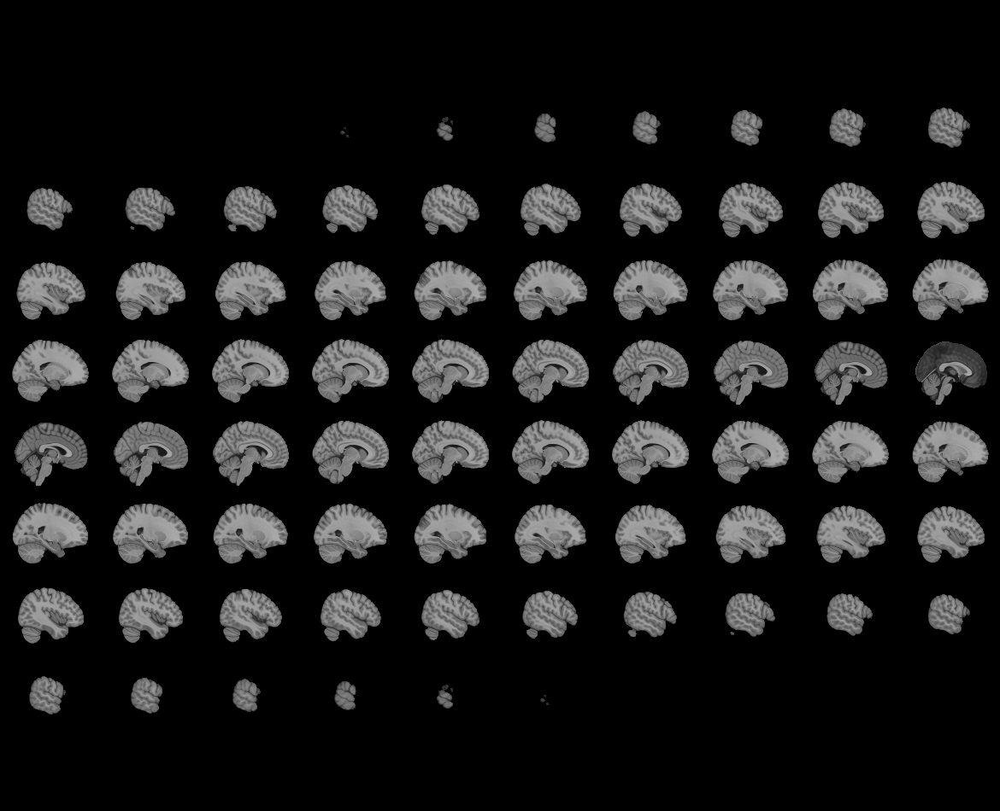
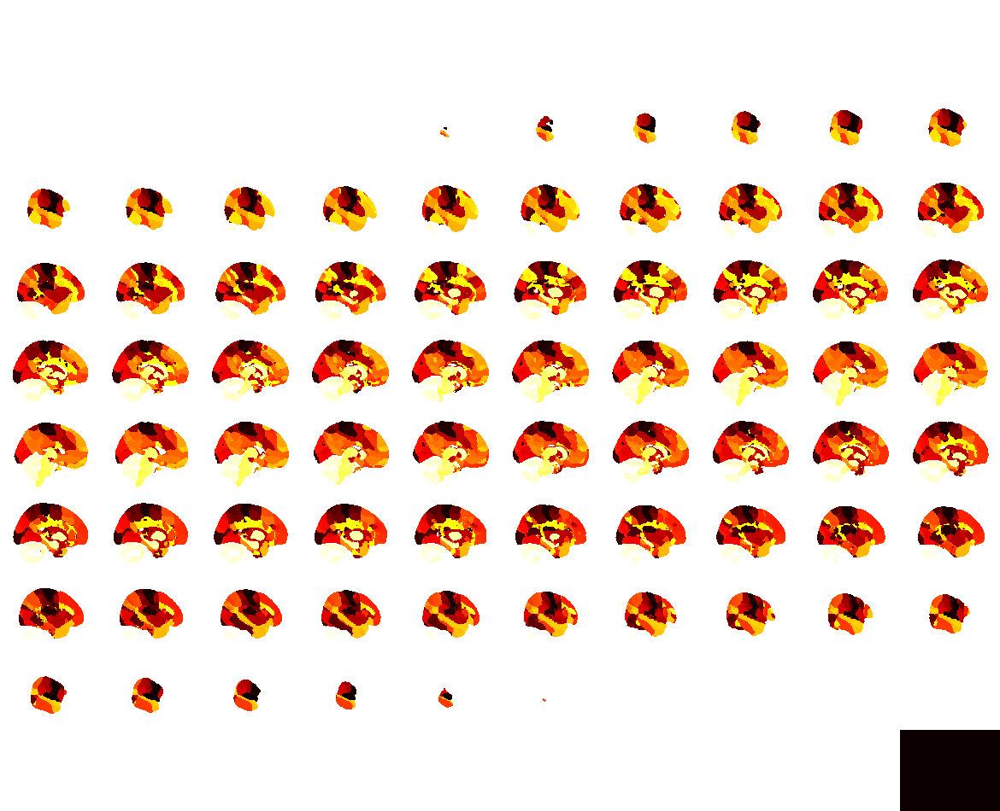

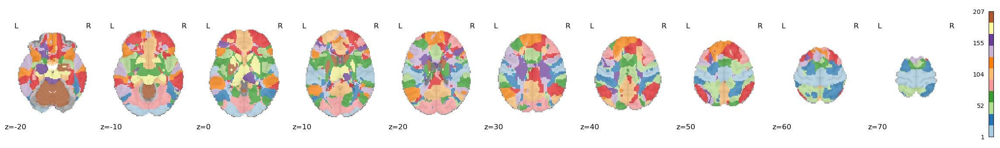

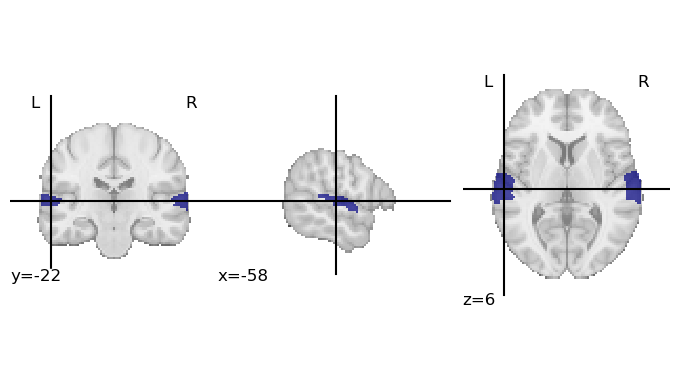

In [78]:
fine_ICP = "/project/3022057.01/resources/rois/ICPAtlas_v4_fine_208parcels.nii.gz"
course_ICP = "/project/3022057.01/resources/rois/ICPAtlas_v4_coarse_79parcels.nii.gz"
mask, atlas, region_labels = create_mask(fine_ICP)
print("Number of Labels in Mask: ", len(region_labels))
view_labels(atlas)
nplot.view_img(atlas)

### Parcellate Each Subject

In [20]:
alldata = parcellate_all(allsubs,mask,region_labels,save=True,verbose=True, location="icp_parcellated_subs")   

NameError: name 'allsubs' is not defined

In [17]:
np.array(alldata).shape

/scratch/zaisou/51014843.dccn-l029.dccn.nl/ipykernel_61088/2957516162.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array(alldata).shape


(400,)

### Load Already Parcellated Subjects and or Simulate Some Data

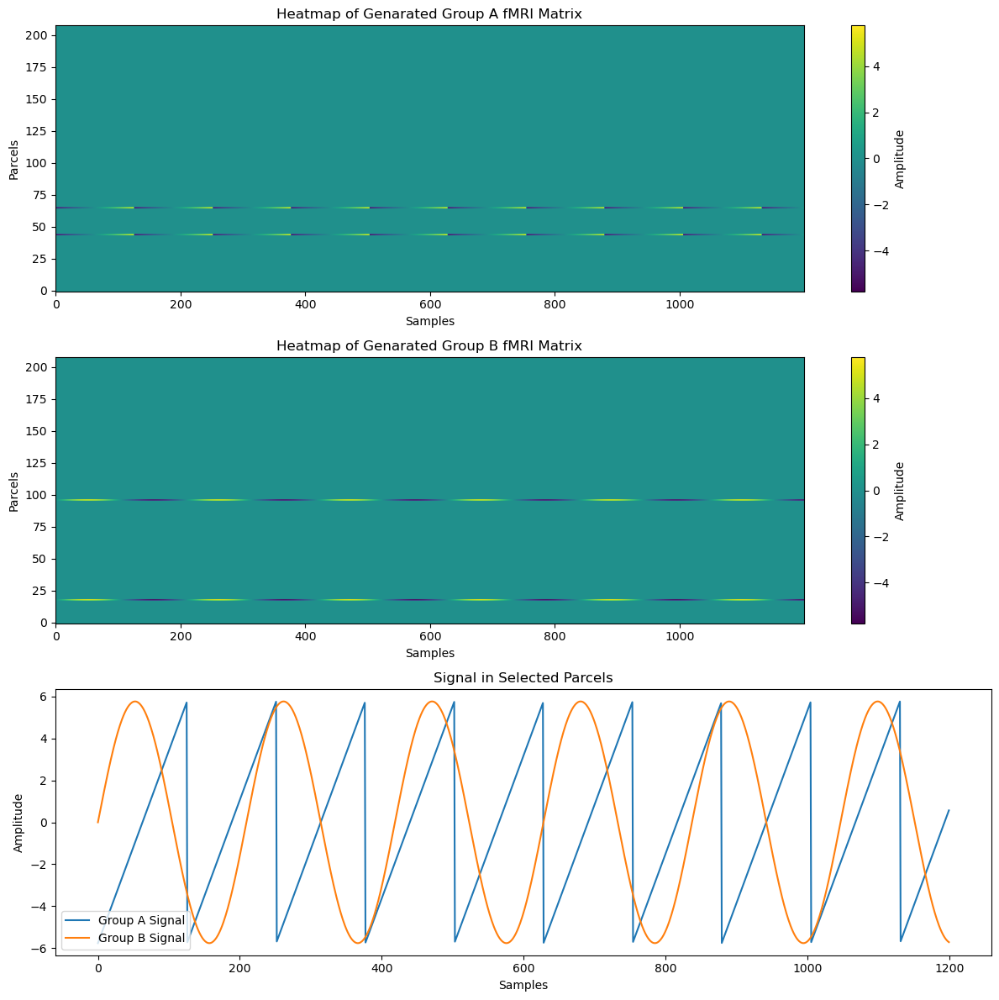

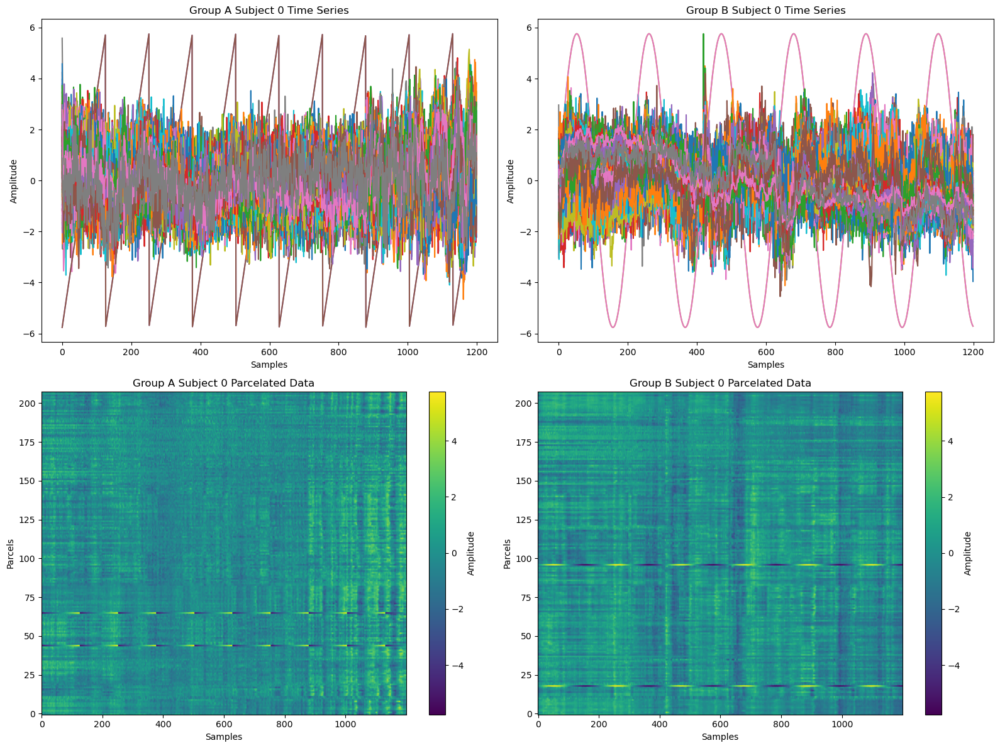

In [136]:
subjects_path = r'/project/3022057.01/icp_parcellated_subs'

groupA_data = []
groupB_data = []
groupA_type = "REST2"
groupB_type = "MOTOR"
simulate = True

if simulate:
    allsubs_data = []
    for subdir, dirs, files in os.walk(subjects_path):
        for file in files:
            if groupA_type in file:
                sub_data = np.load(os.path.join(subdir,file))
                if sub_data.shape[0] == 1200:
                    allsubs_data.append(sub_data)
    allsubs_data = np.array(allsubs_data)
    groupA_data, groupB_data, groupA_parcels, groupB_parcels = simulate_data(allsubs_data, sig_freqA=.05,sig_freqB=.03, spatial_ratio=.01, temporal_ratio=1.0, sub_ratio=.5, noise_level=0.00, shared_level=0.0, simulateA=True, simulateB=True)
else:
    for subdir, dirs, files in os.walk(subjects_path):
        for file in files:
            if groupA_type in file:
                sub_data = np.load(os.path.join(subdir,file))
                if sub_data.shape[0] == 1200:
                    groupA_data.append(sub_data)
            elif (groupB_type in file):
                groupB_data.append(np.load(os.path.join(subdir,file)))

groupA_data = np.array(groupA_data)
groupB_data = np.array(groupB_data)
# # all_subjects_data = np.array(all_subjects_data)
# last = groupA_data[0].shape
# for sub in groupA_data:
#     if last != sub.shape:
#         print(sub.shape)
#     else:
#         last = sub.shape
# last = groupB_data[0].shape
# for sub in groupB_data:
#     if last != sub.shape:
#         print(sub.shape)
#     else:
#         last = sub.shape
visualize_semi_simulated_subject(groupA_data, groupB_data)

### Standardize & Demean Each ROI Time Series for Each Subject and Demean Across Parcels for Each Timepoint

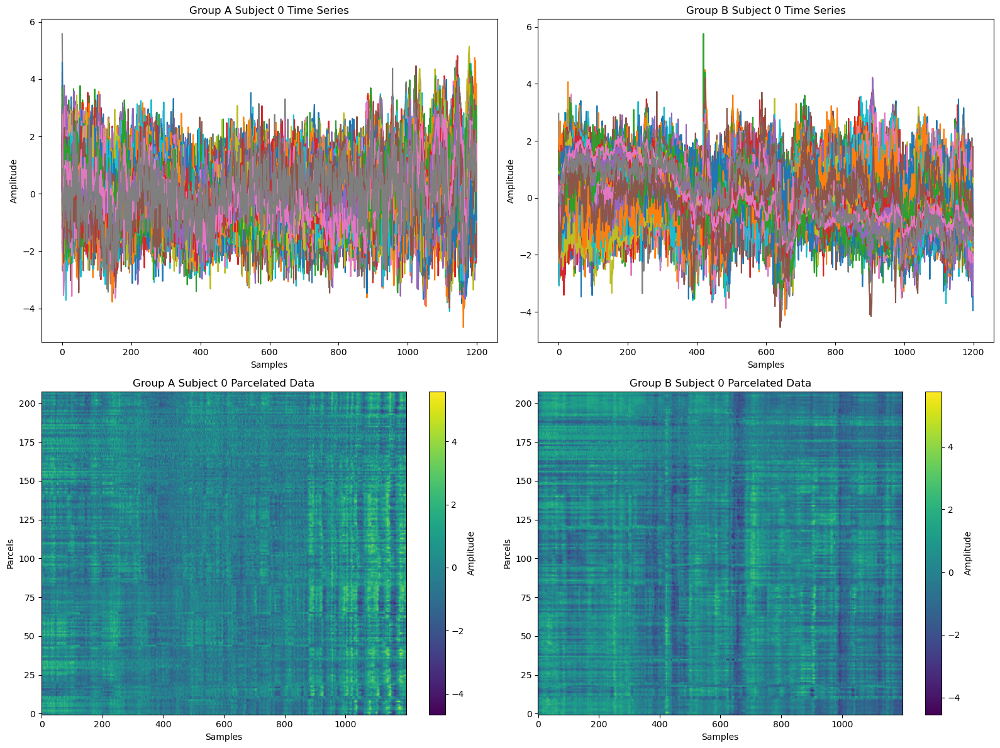

In [137]:
preprocessed_GroupA = standardize_demean(groupA_data)
preprocessed_GroupB = standardize_demean(groupB_data)
visualize_semi_simulated_subject(preprocessed_GroupA, preprocessed_GroupB)

### Create Covariance Matrices

In [138]:
groupA_covs = []
for subject in preprocessed_GroupA:
    groupA_covs.append(regcov(subject, gamma=0.0000, sc=1.0, beta=0.0, ddof=1.0))
groupA_covs = np.array(groupA_covs)

groupB_covs = []
for subject in preprocessed_GroupB:
    groupB_covs.append(regcov(subject, gamma=0.0000, sc=1.0, beta=0.0, ddof=1.0))
groupB_covs = np.array(groupB_covs)

### Average Covariance Matrices

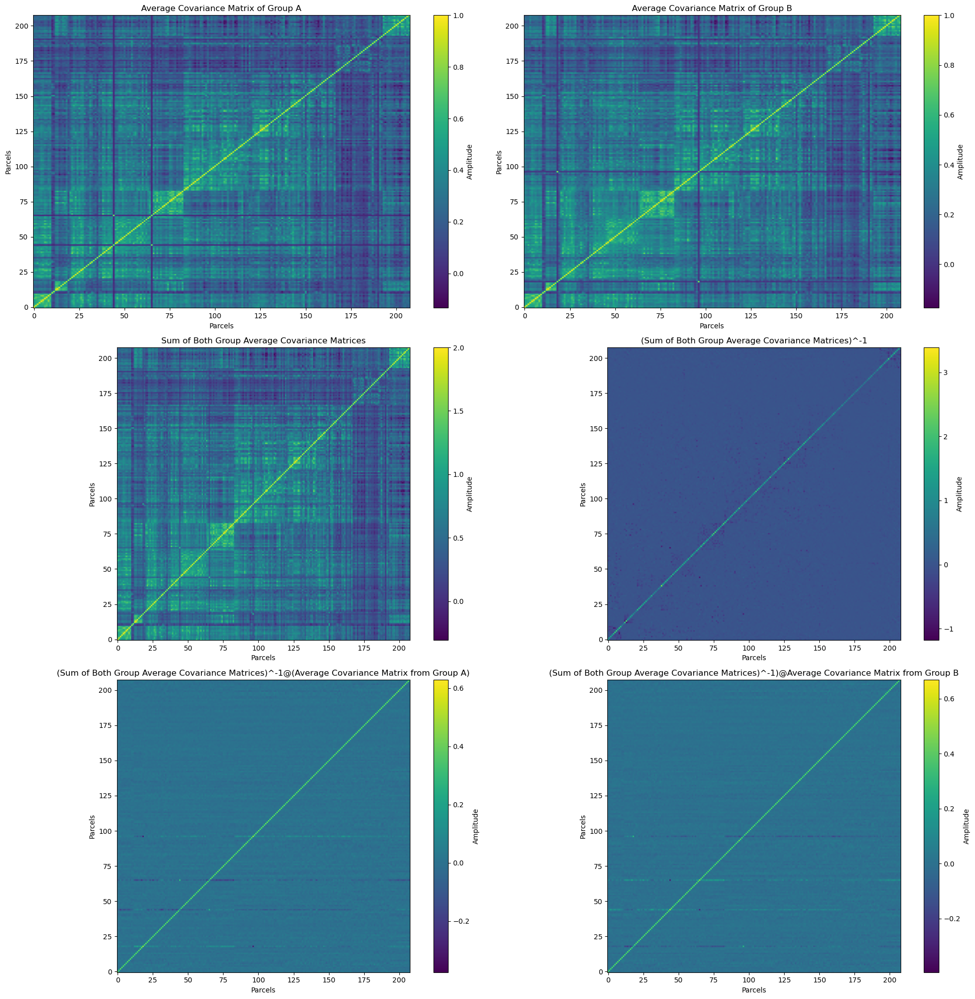

In [139]:
groupA_average_cov, groupB_average_cov = average_covs(groupA_covs, groupB_covs, visualize=True)

### Test Pipeline on Single Subject

In [84]:
sub_image1 = '/project_cephfs/3022017.01/S1200/143426/MNINonLinear/Results/rfMRI_REST2_LR/rfMRI_REST2_LR.nii.gz'
sub_image2 = '/project_cephfs/3022017.01/S1200/143426/MNINonLinear/Results/tfMRI_MOTOR_LR/tfMRI_MOTOR_LR.nii.gz'
onesub_fMRI = parcellate(nimg.load_img(sub_image1),mask,region_labels)
onesub_task = parcellate(nimg.load_img(sub_image2),mask,region_labels)

/opt/anaconda3/2023.03/lib/python3.10/site-packages/joblib/memory.py:349: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  return self.func(*args, **kwargs)


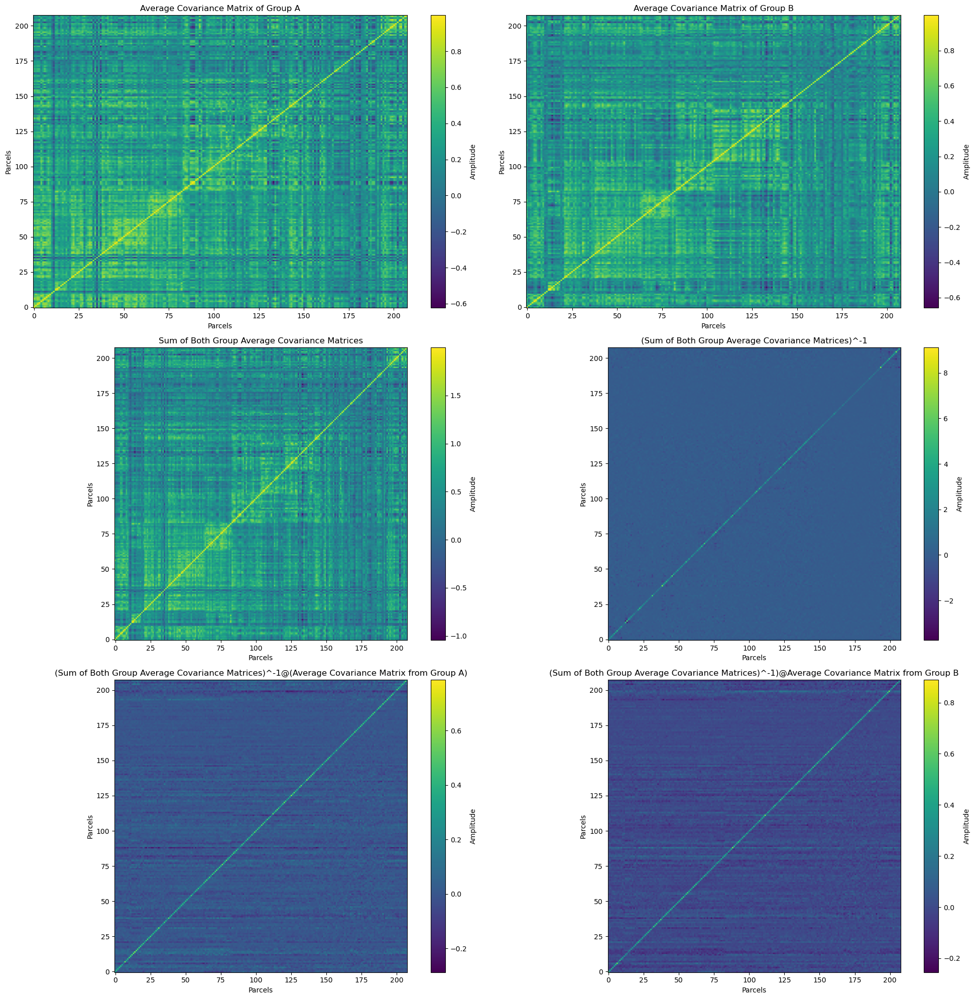

In [142]:
onesub_fMRI_3d = onesub_fMRI[np.newaxis,:,:]
onesub_task_3d = onesub_task[np.newaxis,:,:]

pp_onesub_fMRI = standardize_demean(onesub_fMRI_3d)
pp_onsesub_task = standardize_demean(onesub_task_3d)
onesub_covA = []
for subject in pp_onesub_fMRI:
    onesub_covA.append(regcov(subject, gamma=0.00001, sc=1.0, beta=0.0, ddof=1.0))
onesub_covA = np.array(onesub_covA)

onesub_covB = []
for subject in pp_onsesub_task:
    onesub_covB.append(regcov(subject, gamma=0.00001, sc=1.0, beta=0.0, ddof=1.0))
onesub_covB = np.array(onesub_covB)

_,_ = average_covs(onesub_covA,onesub_covB)

### FKT

In [122]:
reshaped_preprocessed_subjects = np.array(np.vstack((preprocessed_GroupA.reshape(-1, preprocessed_GroupA.shape[2]), preprocessed_GroupB.reshape(-1, preprocessed_GroupB.shape[2]))))

#### PCA FKT Comparison

In [76]:
thresholds = np.linspace(0.5,.8,num=50)
fkt_variance_all = []
group_variance_all = []
n_filters = []
for t in thresholds:
    fkt_eigs_loop, fkt_filters_loop = FKT(groupA_average_cov, groupB_average_cov, auto_select=True, threshold= t,visualize=False)
    if fkt_eigs_loop.shape[0] > 0:
        fkt_variance_loop, group_variance_loop = f_test(fkt_filters_loop,reshaped_preprocessed_subjects,verbose=False)
        group_variance_all.append(group_variance_loop)
        fkt_variance_all.append(fkt_variance_loop)
        n_filters.append(fkt_eigs_loop.shape[0])


TypeError: f_test() missing 2 required positional arguments: 'preprocessed_GroupA' and 'preprocessed_GroupB'

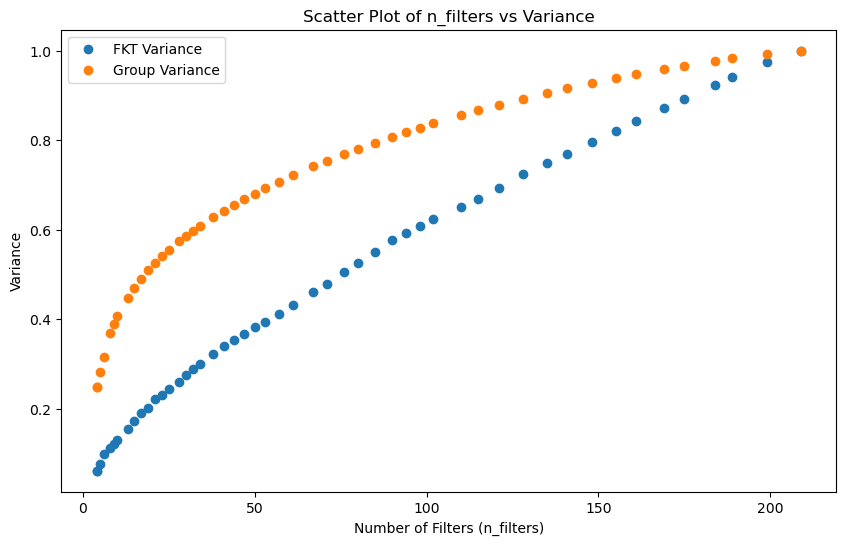

In [112]:
# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(n_filters, fkt_variance_all, label='FKT Variance')
plt.scatter(n_filters, group_variance_all, label='Group Variance')

# Add labels and title
plt.xlabel('Number of Filters (n_filters)')
plt.ylabel('Variance')
plt.title('Scatter Plot of n_filters vs Variance')
plt.legend()

# Show the plot
plt.show()

#### Numerical Stability

In [205]:
groupA_eigs1, groupA_filters1, groupB_eigs1, groupB_filters1, groupA_eigs2, groupA_filters2, groupB_eigs2, groupB_filters2, groupA_eigs3, groupA_filters3, groupB_eigs3, groupB_filters3 = numerical_stability(groupA_average_cov, groupB_average_cov)

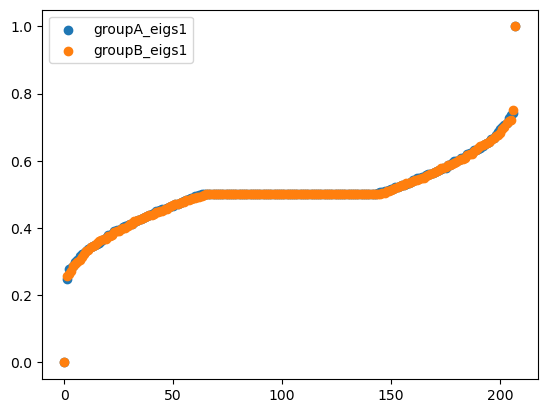

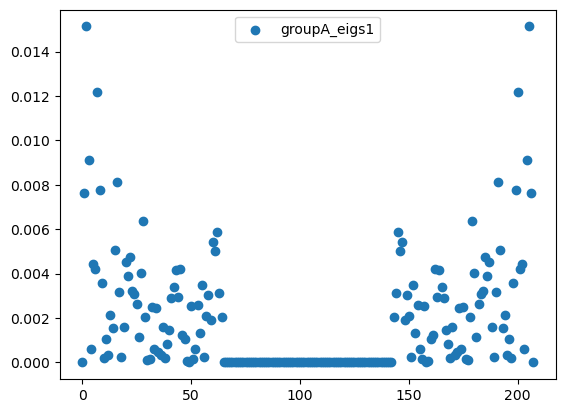

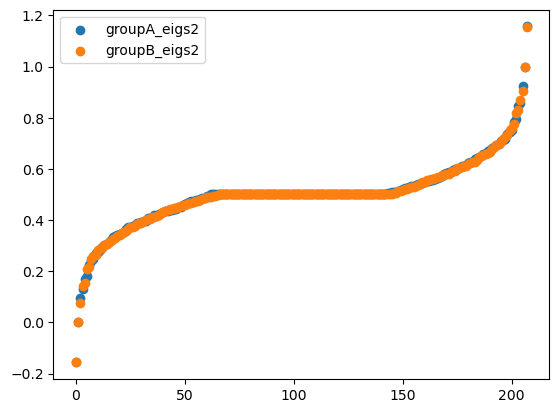

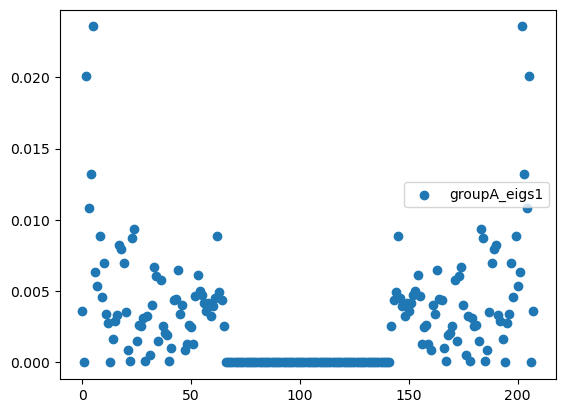

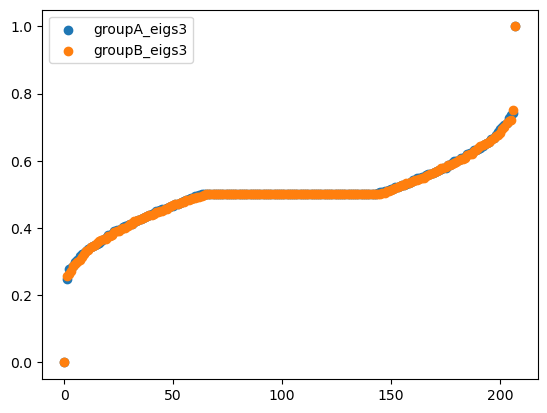

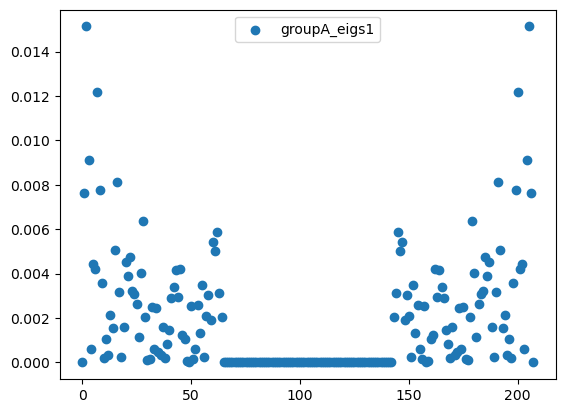

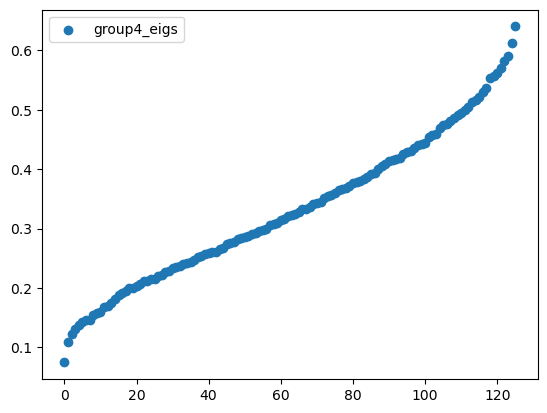

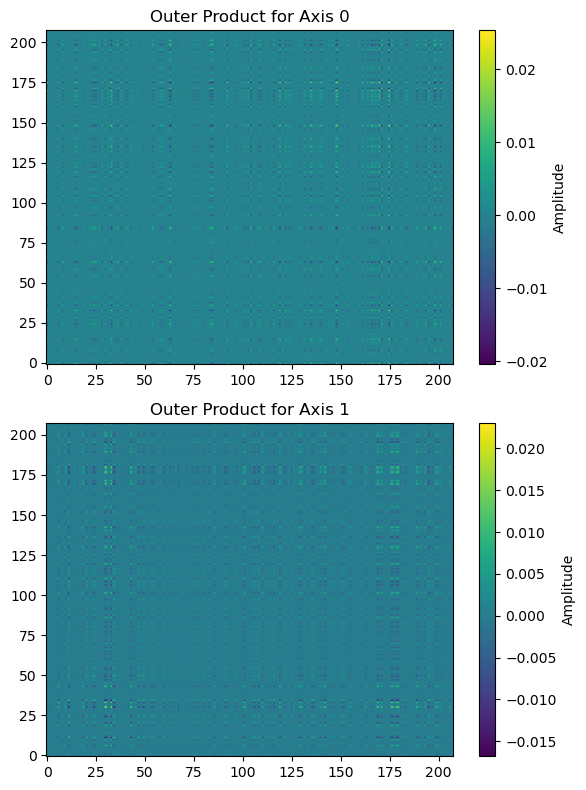

In [208]:
plt.figure()
plt.scatter(range(0,groupA_eigs1.shape[0]), groupA_eigs1,label='groupA_eigs1')
plt.scatter(range(0,groupB_eigs1.shape[0]), groupB_eigs1,label='groupB_eigs1')
plt.legend()
plt.show()

plt.figure()
plt.scatter(range(0,groupA_eigs1.shape[0]),np.abs(groupA_eigs1-groupB_eigs1),label='groupA_eigs1')
plt.legend()
plt.show()

plt.figure()
plt.scatter(range(0,groupA_eigs2.shape[0]), groupA_eigs2,label='groupA_eigs2')
plt.scatter(range(0,groupB_eigs2.shape[0]), groupB_eigs2,label='groupB_eigs2')
plt.legend()
plt.show()

plt.figure()
plt.scatter(range(0,groupA_eigs2.shape[0]),np.abs(groupA_eigs2-groupB_eigs2),label='groupA_eigs1')
plt.legend()
plt.show()

plt.figure()
plt.scatter(range(0,groupA_eigs3.shape[0]), groupA_eigs3,label='groupA_eigs3')
plt.scatter(range(0,groupB_eigs3.shape[0]), groupB_eigs3,label='groupB_eigs3')
plt.legend()
plt.show()

plt.figure()
plt.scatter(range(0,groupA_eigs3.shape[0]),np.abs(groupA_eigs3-groupB_eigs3),label='groupA_eigs1')
plt.legend()
plt.show()

gamma=0.0
l2=0.3
l3=.01
group4_eigs, group4_filters = eigh(groupA_average_cov - l3*np.linalg.inv(groupB_average_cov), (1-gamma)*(groupA_average_cov+groupB_average_cov) + gamma*np.identity(groupB_average_cov.shape[0]) + l2*np.identity(groupB_average_cov.shape[0]),eigvals_only=False,subset_by_value=[0,1.0])

plt.figure()
plt.scatter(range(0,group4_eigs.shape[0]), group4_eigs,label='group4_eigs')
plt.legend()
plt.show()

group4_filters = group4_filters[:,np.where((group4_eigs-.5)>.1)[0]]
# Create a figure and axes for subplots
fig, axes = plt.subplots(group4_filters.shape[1], 1, figsize=(6, 4*group4_filters.shape[1]))

 # Iterate over each axis of filters
for i in range(group4_filters.shape[1]):
     # Access the subplot using indexing
     if group4_filters.shape[1] == 1:
        ax = axes
     else:
        ax = axes[i]

     # Calculate the outer product image for the current axis
     outer_product = group4_filters[:, i][:, np.newaxis] @ group4_filters[:, i][:, np.newaxis].T

     # Plot the outer product image on the corresponding subplot
     im = ax.imshow(outer_product, aspect='auto', cmap='viridis', origin='lower')
     ax.set_title(f"Outer Product for Axis {i}")
     fig.colorbar(im, ax=ax, label='Amplitude')

plt.tight_layout()
plt.show()

#### Regularization

In [85]:
_, bad_filters = FKT(groupA_average_cov, groupB_average_cov, auto_select=True, threshold= 0.75, visualize=True)

TypeError: FKT() missing 1 required positional argument: 'data'

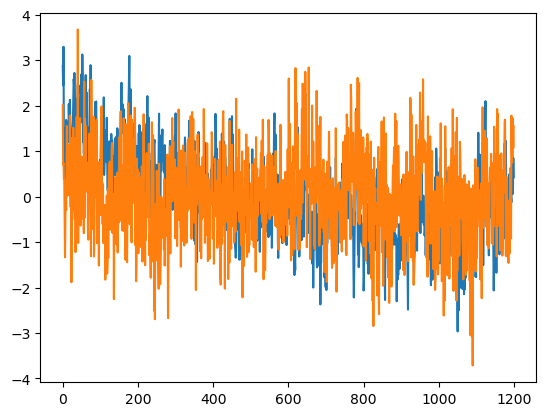

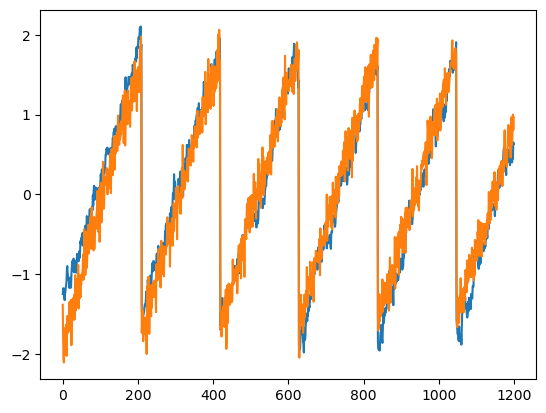

Eig for Filter 1 on Group A: 0.8576332701192169
Eig for Filter 1 on Group B: 0.1423667298807838
Eig for Filter 1 on Group A: 0.9864993473823918
Eig for Filter 1 on Group B: 0.01350065261760951


In [28]:
badind = np.where(np.abs(bad_filters[:,-1]) > .1)[0]
plt.figure()
plt.plot(preprocessed_GroupA[0,:,badind[0]])
plt.plot(preprocessed_GroupA[0,:,badind[1]])
plt.show()

goodind = np.where(np.abs(bad_filters[:,-2]) > .15)[0]
plt.figure()
plt.plot(preprocessed_GroupA[20,:,goodind[0]])
plt.plot(preprocessed_GroupA[20,:,goodind[1]])
plt.show()

print("Eig for Filter 1 on Group A:", bad_filters[:,-2].T@groupA_average_cov@bad_filters[:,-2])
print("Eig for Filter 1 on Group B:",bad_filters[:,-2].T@groupB_average_cov@bad_filters[:,-2])
print("Eig for Filter 1 on Group A:",bad_filters[:,-1].T@groupA_average_cov@bad_filters[:,-1])
print("Eig for Filter 1 on Group B:",bad_filters[:,-1].T@groupB_average_cov@bad_filters[:,-1])


In [52]:
_, _ = FKT(groupA_average_cov, groupB_average_cov, auto_select=True, threshold= 0.75, visualize=True, regularize=True)

TypeError: FKT() missing 1 required positional argument: 'data'

#### FKT Analysis Application for ICA

Number of FKT Filters/Eigenvectors: 2
F Ratio of FKT Variance/Total Variance: 0.014120065828881652
F Ratio of PCA Variance/Total Variance: 0.10970792342514342
F Ratio of FKT Variance/PCA Variance: 0.12870598027968455


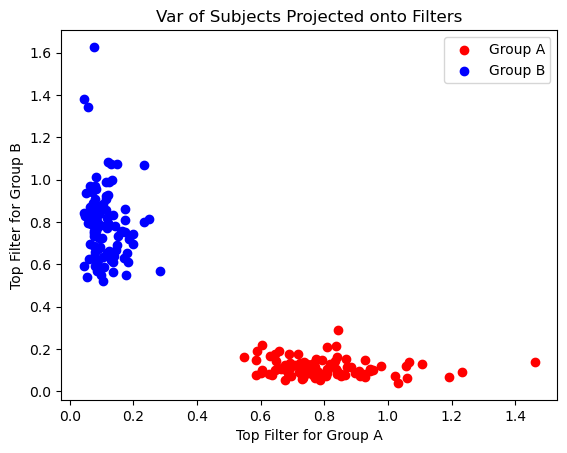

In [123]:
fkt_eigs, fkt_filters, groupA_fktfilters, groupB_fktfilters = FKT(groupA_average_cov, groupB_average_cov, reshaped_preprocessed_subjects, auto_select=True, threshold=0.75, visualize=False, pca_fkt=False, regularize=True, gamma=0.00, l2=0.3 ,l3=0.000)
fkt_variance, group_variance = f_test(fkt_filters,reshaped_preprocessed_subjects,preprocessed_GroupA,preprocessed_GroupB)

In [48]:
u,s,v = np.linalg.svd(fkt_filters)
print("Singular Values of FKT Filters:", s)

Singular Values of FKT Filters: [0.66903649 0.61034243 0.54597635]


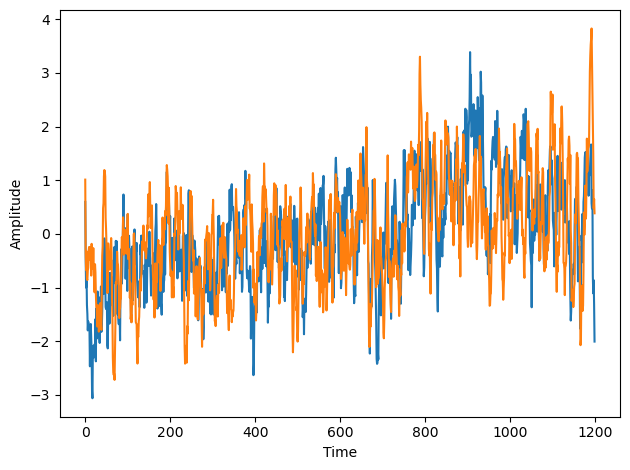

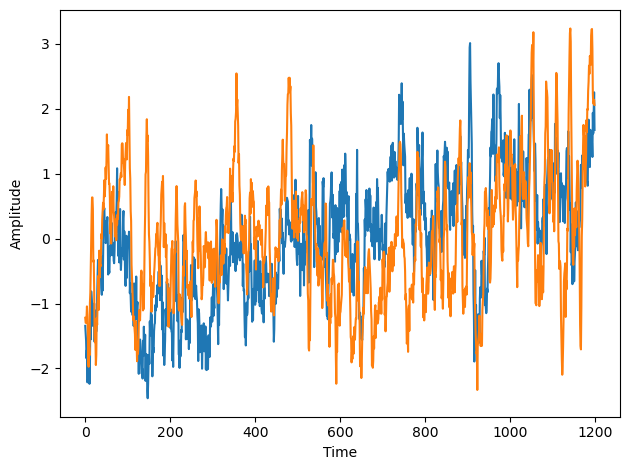

In [92]:
groupA_subject = preprocessed_GroupA[np.random.choice(range(preprocessed_GroupA.shape[0])),:,:]
groupB_subject = preprocessed_GroupB[np.random.choice(range(preprocessed_GroupB.shape[0])),:,:]
plt.figure()
plt.plot(groupA_subject[:,groupA_parcels])
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.tight_layout()
plt.show()

plt.figure()
plt.plot(groupB_subject[:,groupB_parcels])
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.tight_layout()
plt.show()

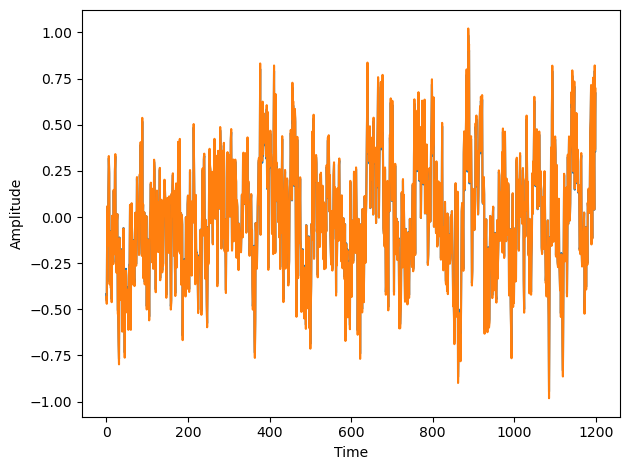

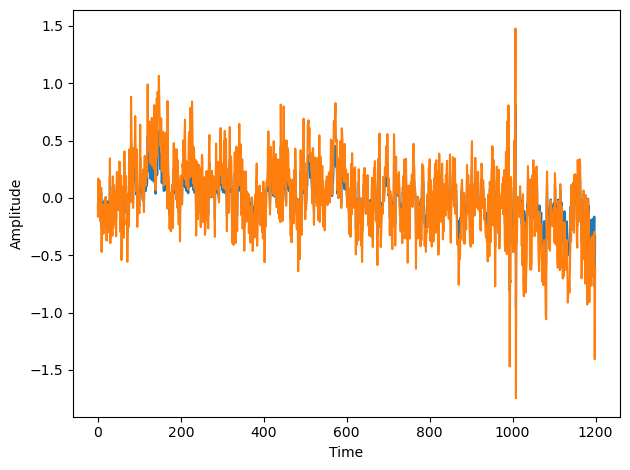

In [127]:
plt.figure()
plt.plot((groupA_subject@np.linalg.pinv(fkt_filters[:,-1:].T)@fkt_filters[:,-1:].T)[:,groupA_parcels])
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.tight_layout()
plt.show()

plt.figure()
plt.plot((groupB_subject@np.linalg.pinv(fkt_filters[:,0:1].T)@fkt_filters[:,0:1].T)[:,groupB_parcels])
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.tight_layout()
plt.show()

In [129]:
# Now assuming time points are features for Spatial ICA
mean_per_feature = np.mean(reshaped_preprocessed_subjects, axis=1, keepdims=True)
demean_preprocessed = reshaped_preprocessed_subjects - mean_per_feature
std_per_feature = np.std(reshaped_preprocessed_subjects, axis=1, keepdims=True)
standardized_preprocessed = demean_preprocessed / std_per_feature
_, group_S, group_Vh = np.linalg.svd(standardized_preprocessed, full_matrices=False)

In [135]:
# np.linalg.norm((groupA_subject@np.linalg.pinv(group_Vh[:200,:])@group_Vh[:200,:])[:,groupA_parcels] - (groupA_subject@np.linalg.pinv(fkt_filters[:,-1:].T)@fkt_filters[:,-1:].T)[:,groupA_parcels], 'fro')

44.398825732049794

### ICA

#### Single Subject IFA

In [54]:
def IFA(data, fkt_filters, visualize, n=fkt_filters.shape[1]):
    data_projected, data_fkt_U, _, _ = FKT_proj(data,fkt_filters)
    ica = FastICA(n_components=n)
    IFA_components = ica.fit_transform(data_projected.T)
    IFA_mixing = data_fkt_U@ica.mixing_

    if visualize:
        plt.figure(figsize=(10, 6))
        num_rows = 2  # Number of rows in the subplot (image + histogram)
        for i in range(fkt_filters.shape[1]):
            # Plot the image
            plt.subplot(num_rows, fkt_filters.shape[1], i + 1)
            plt.imshow(fkt_filters[:, i:i + 1].T, aspect='auto', cmap='viridis', origin='lower')
            plt.colorbar(label='Amplitude')
            plt.title("Spatial Filters From FKT (Row {})".format(i + 1))

            # Plot the histogram
            plt.subplot(num_rows, fkt_filters.shape[1], fkt_filters.shape[1] + i + 1)
            plt.hist(fkt_filters[:, i], bins=20, color='blue', alpha=0.7)
            plt.title("Histogram of Filter {}".format(i + 1))

        plt.tight_layout()
        plt.show()

        plt.figure()
        plt.imshow(ica.mixing_,aspect='auto', cmap='viridis', origin='lower')
        plt.colorbar(label='Amplitude')
        plt.title("Mixing Matrix from ICA on FKT Projected")
        plt.show()
        
        plt.figure(figsize=(10, 6))
        num_rows = 2  # Number of rows in the subplot (image + histogram)
        for i in range(IFA_components.shape[1]):
            # Plot the image
            plt.subplot(num_rows, IFA_components.shape[1], i + 1)
            plt.imshow(IFA_components[:, i:i + 1].T, aspect='auto', cmap='viridis', origin='lower')
            plt.colorbar(label='Amplitude')
            plt.title("Independent Component from ICA on FKT Projected (Row {})".format(i + 1))

            # Plot the histogram
            plt.subplot(num_rows, IFA_components.shape[1], IFA_components.shape[1] + i + 1)
            plt.hist(IFA_components[:, i], bins=20, color='blue', alpha=0.7)
            plt.title("Histogram of Independent Filter {}".format(i + 1))
        plt.tight_layout()
        plt.show()
        
        # Create a figure and axes for subplots
        fig, axes = plt.subplots(IFA_components.shape[1], 1, figsize=(6, 4*IFA_components.shape[1]))
        for i in range(IFA_components.shape[1]):
            if IFA_components.shape[1] == 1:
                ax = axes
            else:
                ax = axes[i]
            ax.plot(IFA_mixing[:,i],label=f"IFA Mixing Vector for Component {i}")
            ax.legend()
        plt.xlabel("Time")
        plt.ylabel("Amplitude")
        plt.tight_layout()
        plt.show()

        plt.tight_layout()
        plt.show()
        
    return IFA_components, IFA_mixing, ica.mixing_


#### Applied to a Subject from Group A

/opt/anaconda3/2023.03/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/opt/anaconda3/2023.03/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:589: UserWarning: n_components is too large: it will be set to 1
  warnings.warn(


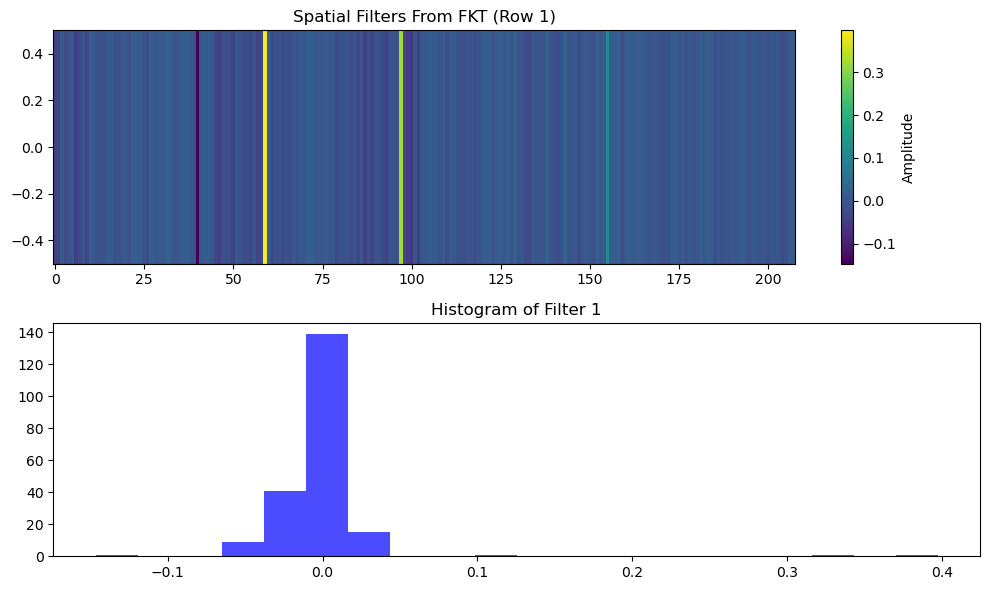

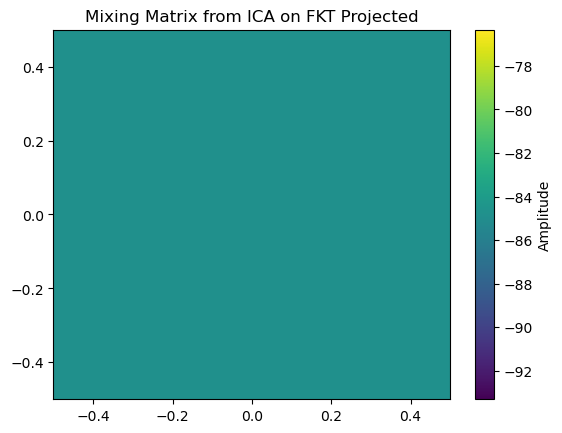

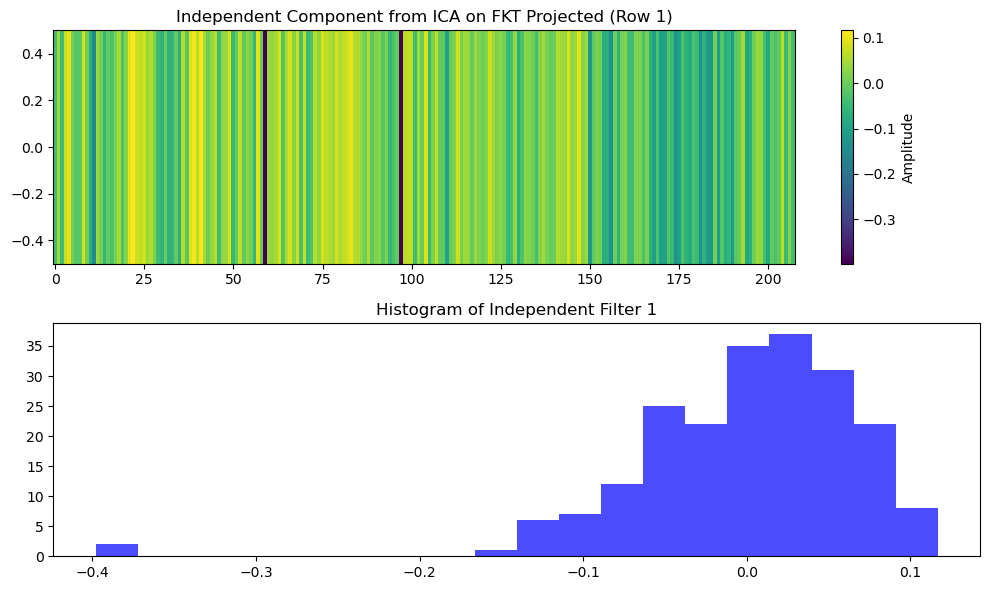

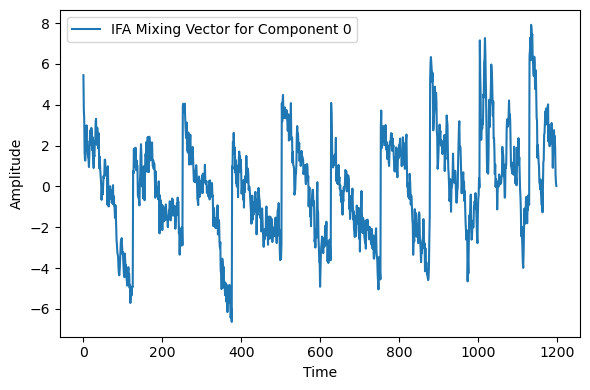

<Figure size 640x480 with 0 Axes>

In [55]:
groupA_subject = preprocessed_GroupA[np.random.choice(range(preprocessed_GroupA.shape[0])),:,:]
groupA_IFAcomponents, _, _ = IFA(groupA_subject, groupA_fktfilters, visualize=True)


#### Applied to a Subject from Group B

/opt/anaconda3/2023.03/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/opt/anaconda3/2023.03/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:589: UserWarning: n_components is too large: it will be set to 2
  warnings.warn(


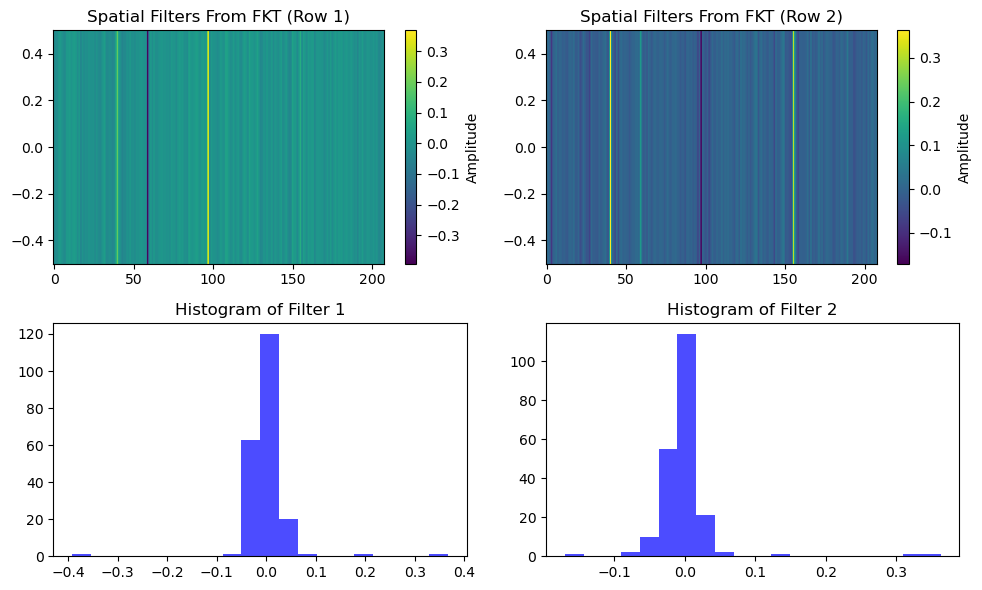

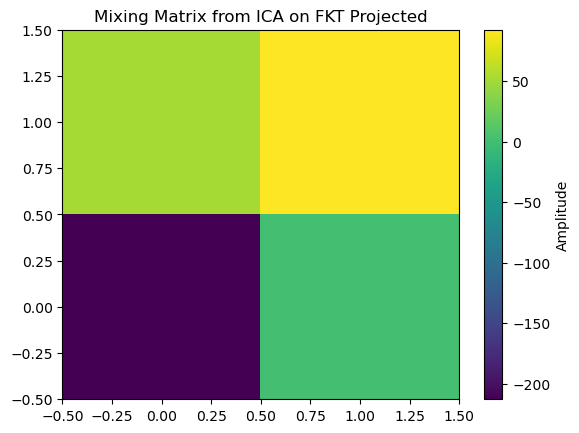

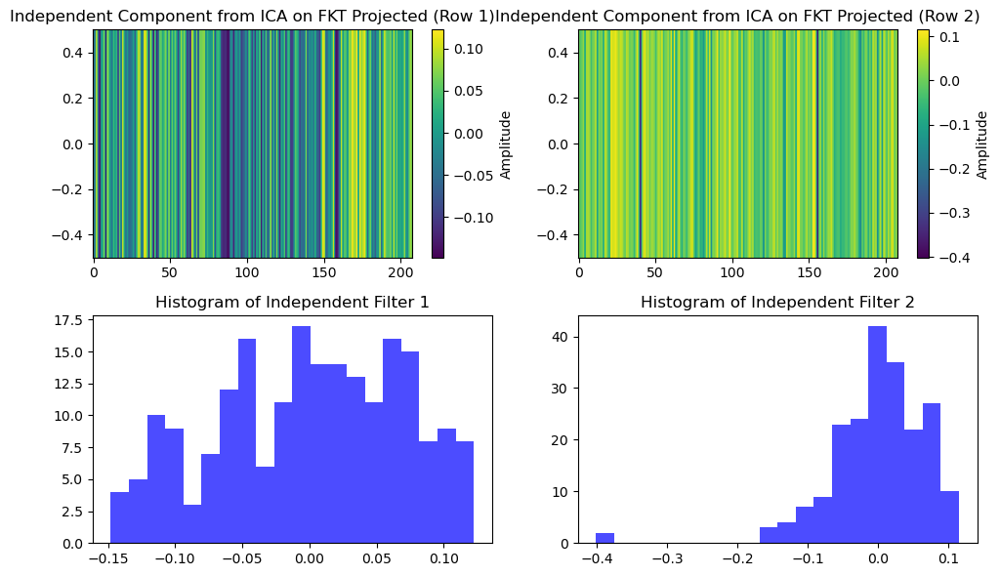

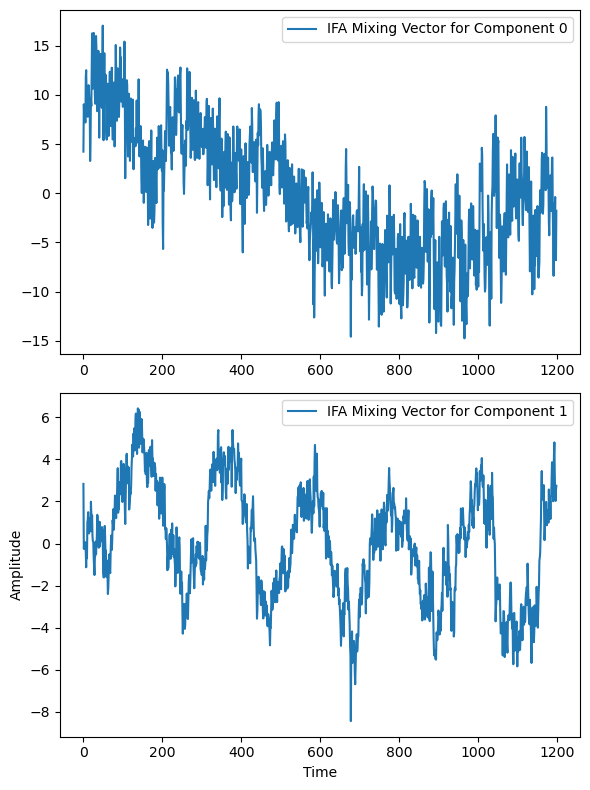

<Figure size 640x480 with 0 Axes>

In [56]:
groupB_subject = preprocessed_GroupB[np.random.choice(range(preprocessed_GroupB.shape[0])),:,:]
groupB_IFAcomponents, _, _ = IFA(groupB_subject, groupB_fktfilters, visualize=True)

#### Group IFA

/opt/anaconda3/2023.03/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


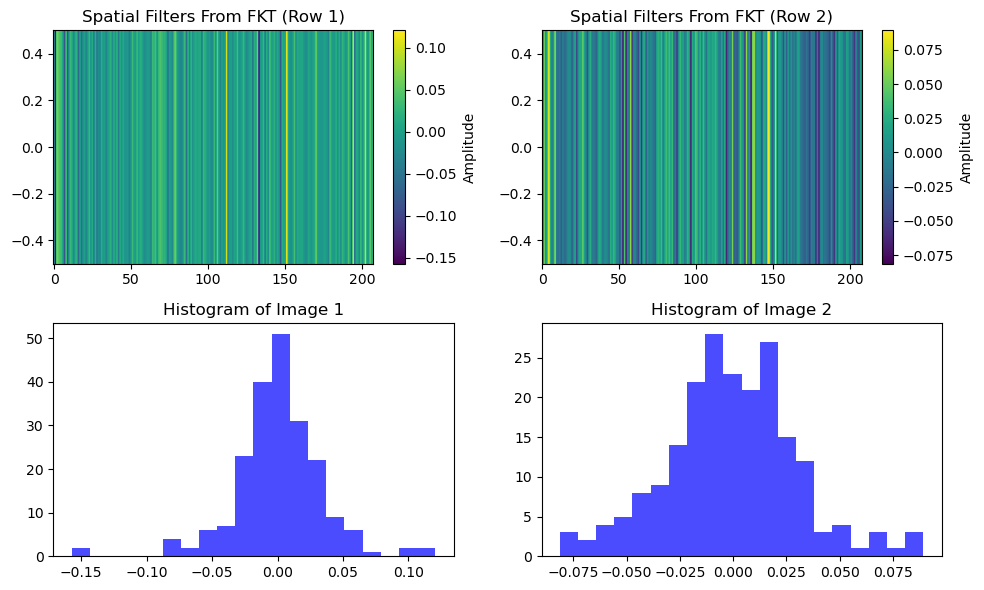

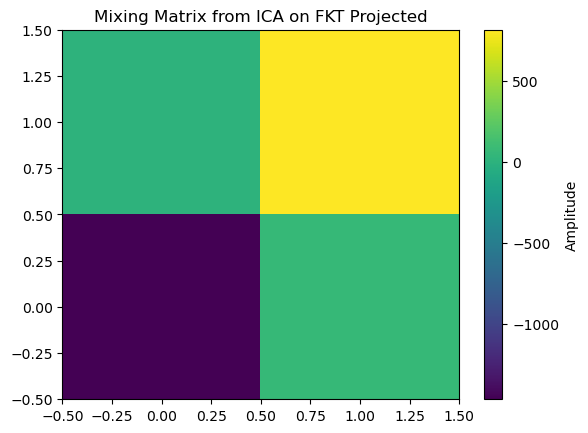

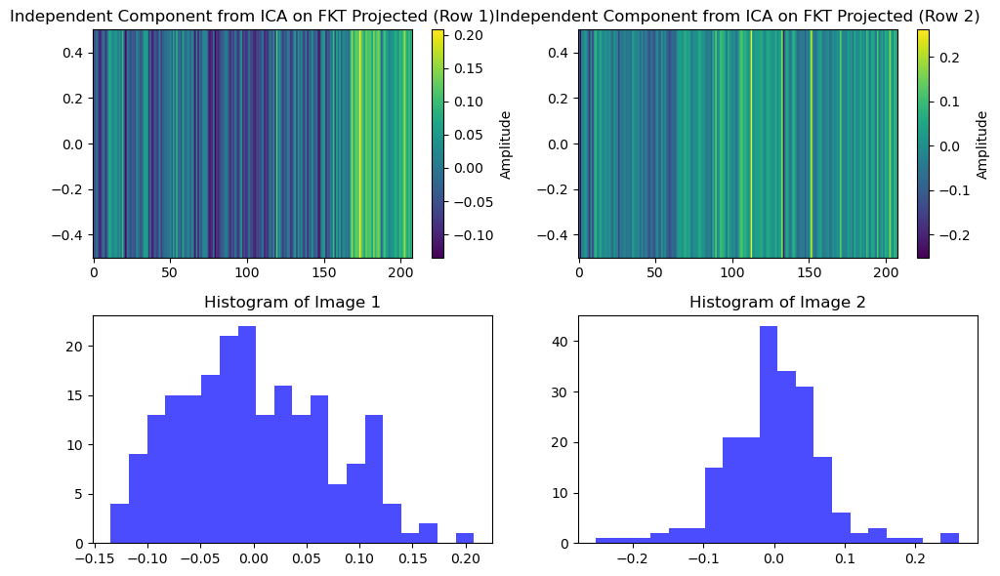

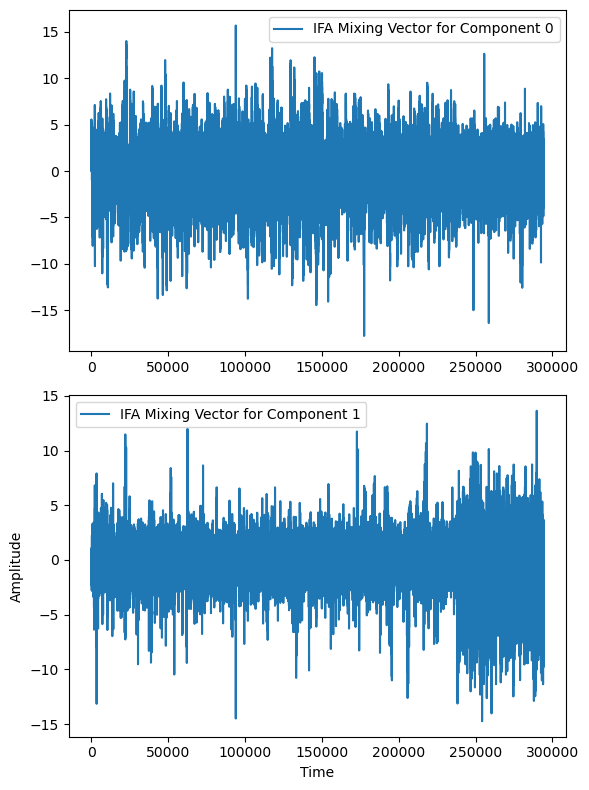

<Figure size 640x480 with 0 Axes>

In [30]:
groupIFA_components, _, _ = IFA(reshaped_preprocessed_subjects, fkt_filters, visualize=True)

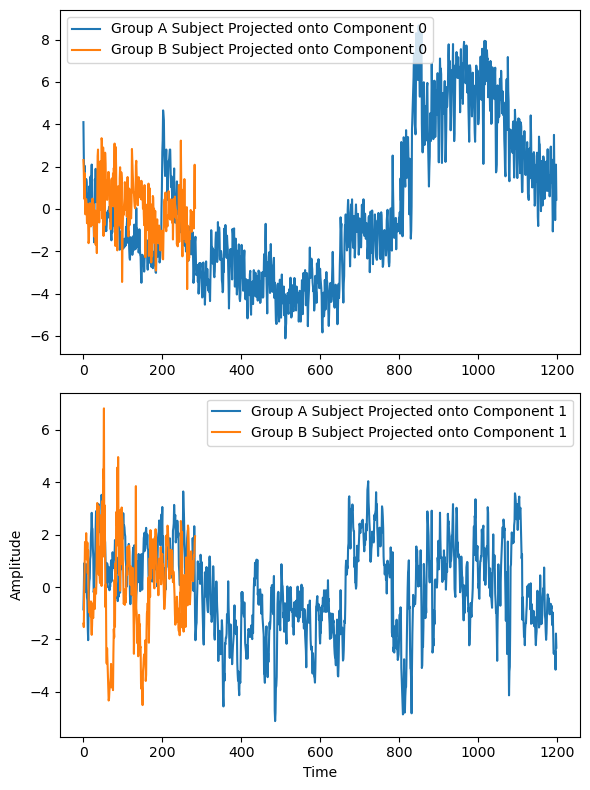

In [43]:
# Create a figure and axes for subplots
fig, axes = plt.subplots(groupIFA_components.shape[1], 1, figsize=(6, 4*groupIFA_components.shape[1]))

for i in range(groupIFA_components.shape[1]):
    if groupIFA_components.shape[1] == 1:
        ax = axes
    else:
        ax = axes[i]
    group_comp = groupIFA_components[:,i]
    std_fkt_ica = (group_comp-np.mean(group_comp,keepdims=True,axis=0))/np.std(group_comp,axis=0)
    masked_comp = group_comp*(np.abs(std_fkt_ica)>1.0)
    ax.plot(groupA_subject@masked_comp,label=f"Group A Subject Projected onto Component {i}")
    ax.plot(groupB_subject@masked_comp,label=f"Group B Subject Projected onto Component {i}")
    ax.legend()
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.tight_layout()
plt.show()

#### Comparison to Group ICA

/opt/anaconda3/2023.03/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


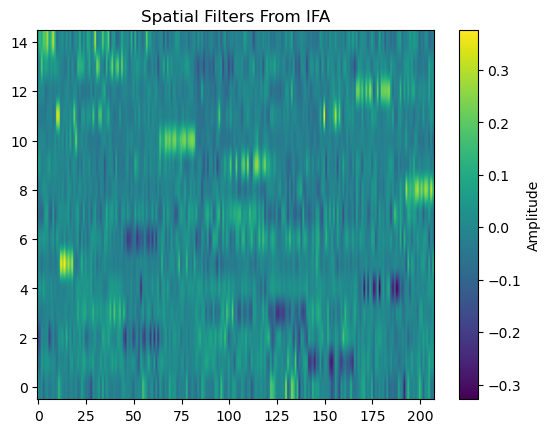

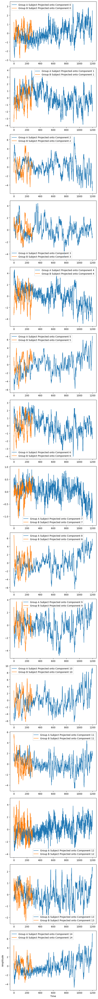

In [31]:
n = 15
ica = FastICA(n_components=n)
group_components = ica.fit_transform(reshaped_preprocessed_subjects.T)
group_mixing = ica.mixing_

plt.figure()
plt.imshow(group_components.T,aspect='auto', cmap='viridis', origin='lower')
plt.colorbar(label='Amplitude')
plt.title("Spatial Filters From IFA")
plt.show()

# Create a figure and axes for subplots
fig, axes = plt.subplots(group_components.shape[1], 1, figsize=(6, 4*group_components.shape[1]))

for i in range(group_components.shape[1]):
    if group_components.shape[1] == 1:
        ax = axes
    else:
        ax = axes[i]
    group_comp = group_components[:,i]
    std_fkt_ica = (group_comp-np.mean(group_comp,keepdims=True,axis=0))/np.std(group_comp,axis=0)
    masked_comp = group_comp*(np.abs(std_fkt_ica)>2.0)
    ax.plot(groupA_subject@masked_comp,label=f"Group A Subject Projected onto Component {i}")
    ax.plot(groupB_subject@masked_comp,label=f"Group B Subject Projected onto Component {i}")
    ax.legend()
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.tight_layout()
plt.show()

### Visualize in Brain

In [156]:
regions = []
brain_strings = []
masked_comps = []
for i in range(np.hstack((groupA_IFAcomponents,groupB_IFAcomponents)).shape[1]):
    groupIFA_comp = np.hstack((groupA_IFAcomponents,groupB_IFAcomponents))[:,i]
    std_groupIFA = (groupIFA_comp-np.mean(groupIFA_comp,keepdims=True,axis=0))/np.std(groupIFA_comp,axis=0)
    masked_comp = std_groupIFA*(np.abs(std_groupIFA)>2)
    masked_comps.append(masked_comp)
    array = np.where(np.abs(std_groupIFA)>2)[0]+1
    regions.append(array)
    stringified_array = ' | '.join([f'(a == {num})' for num in array])
    final_string = f"(({stringified_array}))"
    brain_strings.append(final_string)
masked_comps = np.array(masked_comps).T

/opt/anaconda3/2023.03/lib/python3.10/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/home/mrstats/zaisou/.local/lib/python3.10/site-packages/nilearn/image/resampling.py:291: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn(
/home/mrstats/zaisou/.local/lib/python3.10/site-packages/nilearn/plotting/html_document.py:65: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(



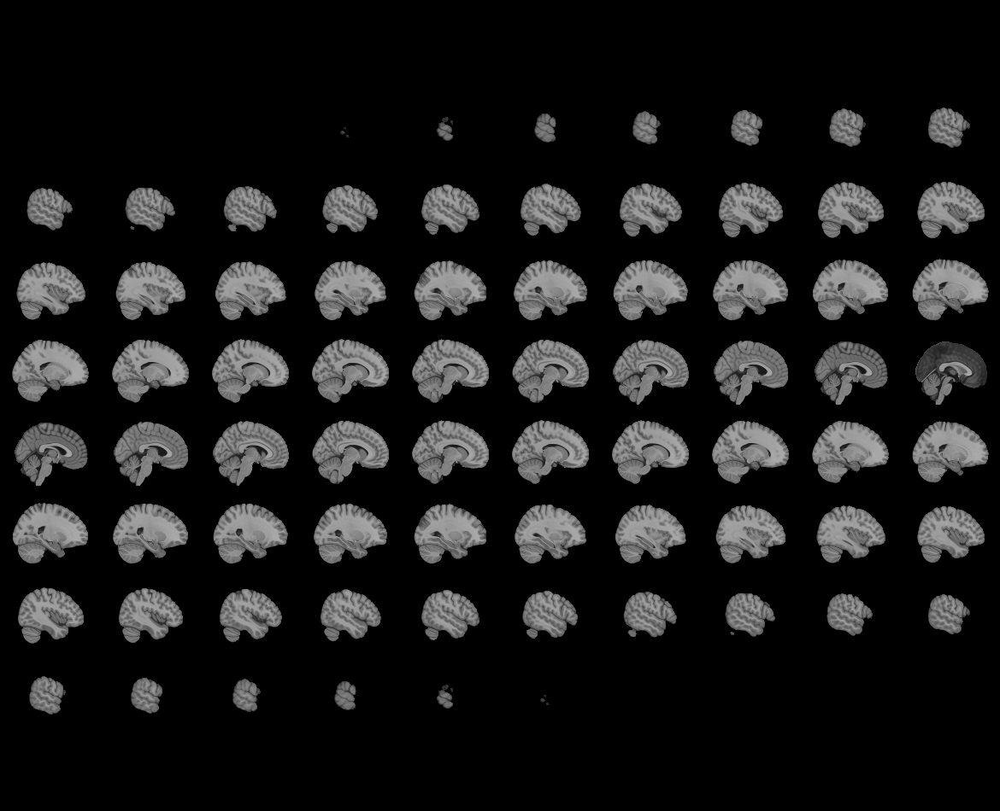
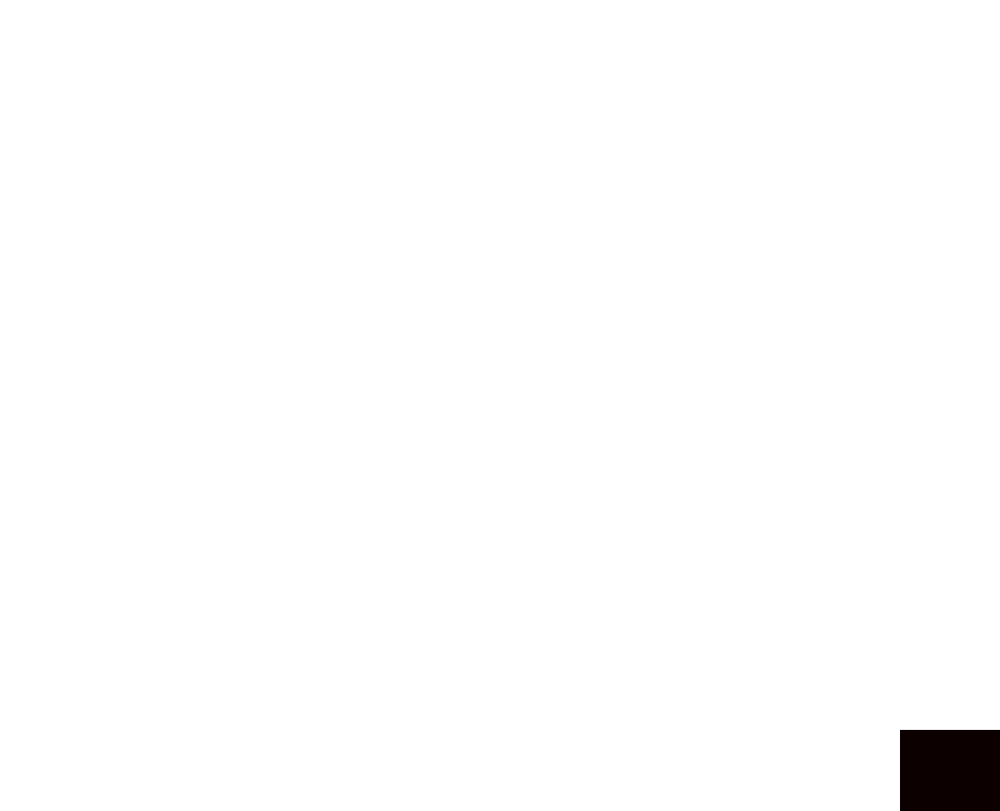

In [115]:
nplot.view_img(nimg.math_img(brain_strings[0], a=atlas))

/opt/anaconda3/2023.03/lib/python3.10/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/home/mrstats/zaisou/.local/lib/python3.10/site-packages/nilearn/image/resampling.py:291: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn(
/home/mrstats/zaisou/.local/lib/python3.10/site-packages/nilearn/plotting/html_document.py:65: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(



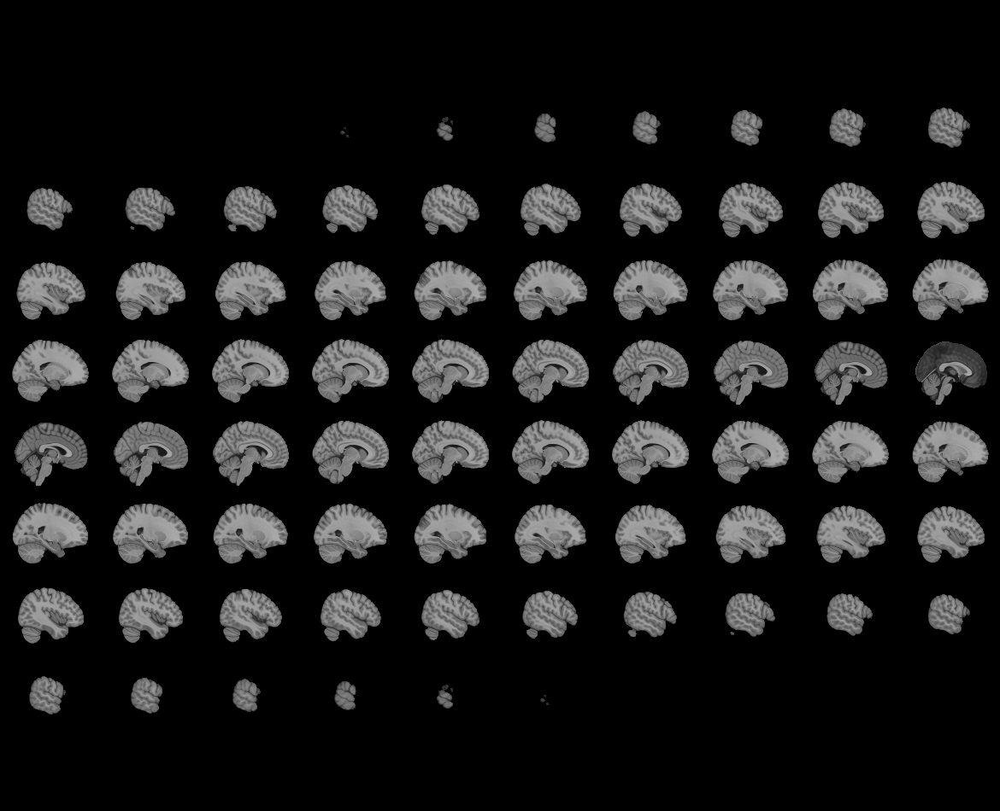
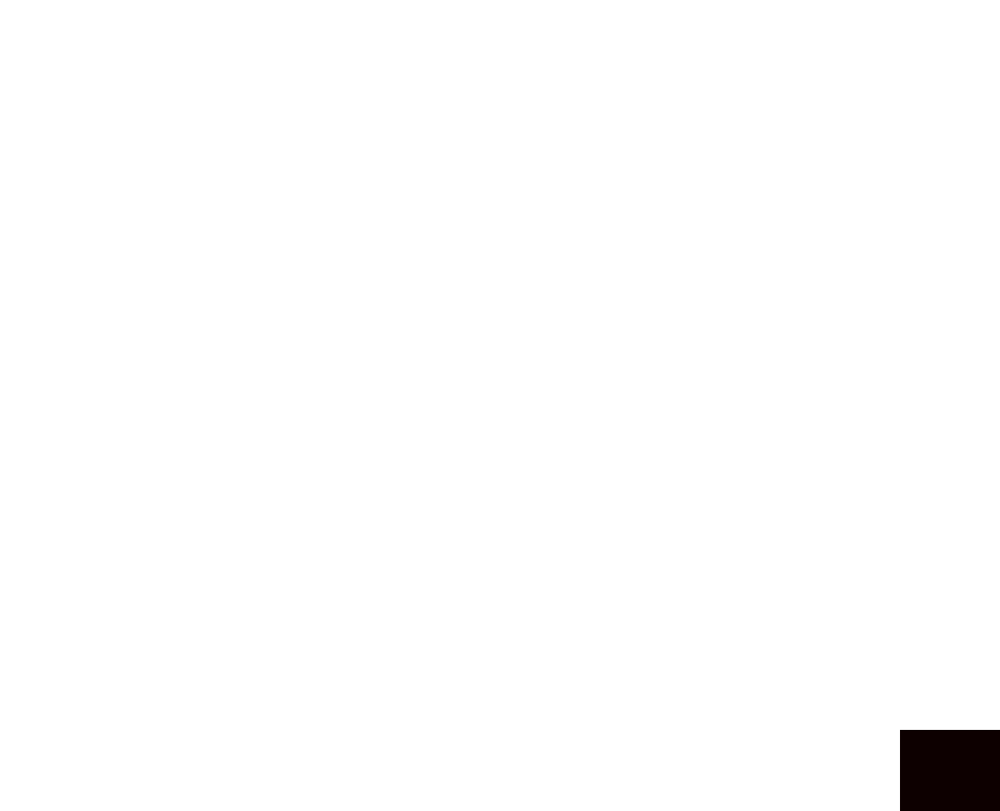

In [111]:
nplot.view_img(nimg.math_img(brain_strings[1], a=atlas))

### Unsupervised IFA

In [52]:
average = np.mean(np.vstack((groupA_covs,groupB_covs)),axis=0)
covs = []
for sub in preprocessed_GroupA:
    covs.append(regcov(sub, gamma=0.00000, sc=1.0, beta=.9, ddof=1.0, groundtruth=average))

for sub in preprocessed_GroupB:
    covs.append(regcov(sub, gamma=0.00000, sc=1.0, beta=.9, ddof=1.0, groundtruth=average))

covs = np.array(covs)

n_matrices = covs.shape[0]
all = np.zeros((n_matrices, n_matrices))
for i in range(n_matrices):
    for j in range(i, n_matrices):
        Cs = covs[j]
        oh = covs[i]

        eigs, _ = FKT(Cs, oh,preprocessed_GroupA, auto_select=True, threshold=.8, visualize=False, regularize=True, gamma=0.00, l2=0.01,l3=0.4)
        print(i,j, eigs)
        all[i, j] = np.sum(eigs)
        all[j, i] = all[i, j]

sns.heatmap(all, cmap='RdBu_r')

0 0 []
0 1 []
0 2 []
0 3 []
0 4 []
0 5 []
0 6 []
0 7 []
0 8 []
0 9 []
0 10 []
0 11 []
0 12 []
0 13 []
0 14 []
0 15 []
0 16 []
0 17 []
0 18 []
0 19 []
0 20 []
0 21 []
0 22 []
0 23 []
0 24 []
0 25 []
0 26 []
0 27 []
0 28 []
0 29 []
0 30 []
0 31 []
0 32 []
0 33 []
0 34 []
0 35 []
0 36 []
0 37 []
0 38 []
0 39 []
0 40 []
0 41 []
0 42 []
0 43 []
0 44 []
0 45 []
0 46 []
0 47 []
0 48 []
0 49 []
0 50 []
0 51 []
0 52 []
0 53 []
0 54 []
0 55 []
0 56 []
0 57 []
0 58 []
0 59 []
0 60 []
0 61 []
0 62 []
0 63 []
0 64 []
0 65 []
0 66 []
0 67 []
0 68 []
0 69 []
0 70 []
0 71 []
0 72 []
0 73 []
0 74 []
0 75 []
0 76 []
0 77 []
0 78 []
0 79 []
0 80 []
0 81 []
0 82 []
0 83 []
0 84 []
0 85 []
0 86 []
0 87 []
0 88 []
0 89 []
0 90 []
0 91 []
0 92 []
0 93 []
0 94 []
0 95 []
0 96 []
0 97 []
0 98 []
0 99 []
0 100 []
0 101 []
0 102 []
0 103 []
0 104 []
0 105 []
0 106 []
0 107 []
0 108 []
0 109 []
0 110 []
0 111 []
0 112 []
0 113 []
0 114 []
0 115 []
0 116 []
0 117 []
0 118 []
0 119 []
0 120 []
0 121 []
0 122 []
0 1

KeyboardInterrupt: 

/opt/anaconda3/2023.03/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


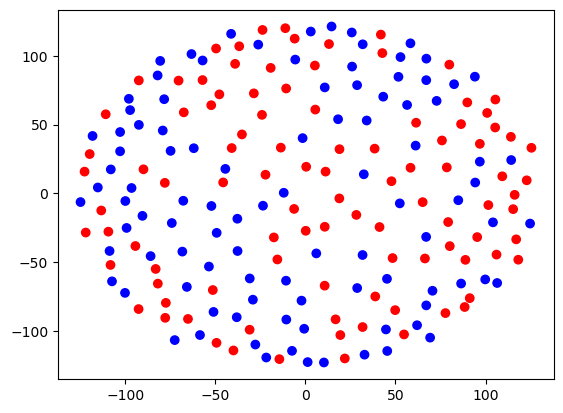

In [69]:
mds = MDS(n_components=2, dissimilarity='precomputed')
embedding = mds.fit_transform(all)

colors = ['blue' for i in range(len(embedding))]
for sub in range(preprocessed_GroupA.shape[0]):
    colors[sub] = 'red'

# Visualize the points with labels in 3D
fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(embedding[:, 0], embedding[:, 1], embedding[:, 2], c=colors)

# # Customize the plot
# ax.set_title('MDS Visualization in 3D with Odd/Even Colors')
# ax.set_xlabel('MDS Dimension 1')
# ax.set_ylabel('MDS Dimension 2')
# ax.set_zlabel('MDS Dimension 3')

plt.scatter(embedding[:, 0], embedding[:, 1], c=colors)

plt.show()